In [1]:
import scanpy as sc
import os
import anndata as ad
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import squidpy as sq
sc.settings.verbosity=0 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.n_jobs=4
sc.settings.set_figure_params(dpi=300, facecolor="white", frameon=False, figsize=(4,4))

plt.rcParams['ps.fonttype'] = 42
plt.rcParams['pdf.fonttype'] = 42

%matplotlib inline




 

# Name to use

In [2]:
F1_NAME = 'F1: Superficial'
F23_NAME = 'F2/3: Stroma_PPARG+'
F1_NAME_REGEN= 'F1: Superficial'
F1_REGEN_NAME= 'F1: Superficial'
F6I = "F6: Inflammatory myofibroblast"



# Load

In [3]:
adata_5k=sc.read_h5ad('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_xenium_webatlas.h5ad')
adata_5k

AnnData object with n_obs × n_vars = 138742 × 5000
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'Site_status', 'celltypes_sFig4_melanoma', 'celltypes_sFig2', 'celltypes_Fig4', 'celltypes_Fig7', 'celltypes_Fig2', 'Niche_name', 'Donor_number', 'Disease', 'sample_id', 'celltypes_Fig4_melanoma'
    uns: 'fig6_new_colors'
    obsm: 'spatial'
    layers: 'counts'

In [4]:
# adata_5k = adata_5k[
#     ~((adata_5k.obs['celltypes_Fig2'] == 'F4: DS_DPEP1+') & (adata_5k.obs['sample_id'] == 'Lesional_atopicdermatitis3'))
# ]

In [5]:
# adata_5k.write('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_xenium_webatlas.h5ad')


In [6]:
adata_5k.obs.sample_id.value_counts()

sample_id
Public_cutaneousmelanoma         98755
Nonlesional_atopicdermatitis2    19988
Lesional_atopicdermatitis3       12330
Nonlesional_atopicdermatitis1     7669
Name: count, dtype: int64

# Figure 2

In [7]:
sc.settings.figdir = "fig2"


In [8]:
adata_5k_fig2=adata_5k[adata_5k.obs["sample_id"].isin(["Nonlesional_atopicdermatitis1" , "Nonlesional_atopicdermatitis2"])]
adata_5k_fig2.obs["sample_id"].value_counts()

sample_id
Nonlesional_atopicdermatitis2    19988
Nonlesional_atopicdermatitis1     7669
Name: count, dtype: int64

In [9]:
desired_order = [
     F1_NAME, 'F2: Universal', F23_NAME, 'F3: FRC-like', 'F4: DS_DPEP1+', 'F4: TNN+COCH+',
    'F5: Schwann-like', 'Schwann', 'Immune cell', 'VE/Pericyte', 'Other'
]

adata_5k.obs['celltypes_Fig2'] = pd.Categorical(adata_5k.obs['celltypes_Fig2'], categories=desired_order, ordered=True)

adata_5k.obs["celltypes_Fig2"] =  adata_5k.obs["celltypes_Fig2"].astype('category')

color_map_5k = {
    'F3: FRC-like': '#FF0000', 
    F23_NAME: '#0000FF', 

    'F5: Schwann-like': "#7850b2", 
    'VE/Pericyte': '#696969', 
    'F2: Universal': '#ADD8E6',
    
    F1_NAME: '#FFFF00',    'F1: Regenerative': '#FFFF00',

    'Schwann': '#000000',
        'F4: DS_DPEP1+': '#008000',          
    'F4: TNN+COCH+': '#80ff80',     
    'Other': '#DCDCDC', 
    
    'Immune cell': "#D2B48C"
}
adata_5k.uns['celltypes_Fig2_colors'] = [color_map_5k[x] for x in adata_5k.obs["celltypes_Fig2"].cat.categories]


Nonlesional_atopicdermatitis1
(7669, 5000)
Nonlesional_atopicdermatitis2
(19988, 5000)


/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/squidpy/pl/_color_utils.py:27: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  target.uns[color_key] = source.uns[color_key]
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/squidpy/pl/_color_utils.py:27: ImplicitModificationWarning: Trying to modify attribute `._uns`

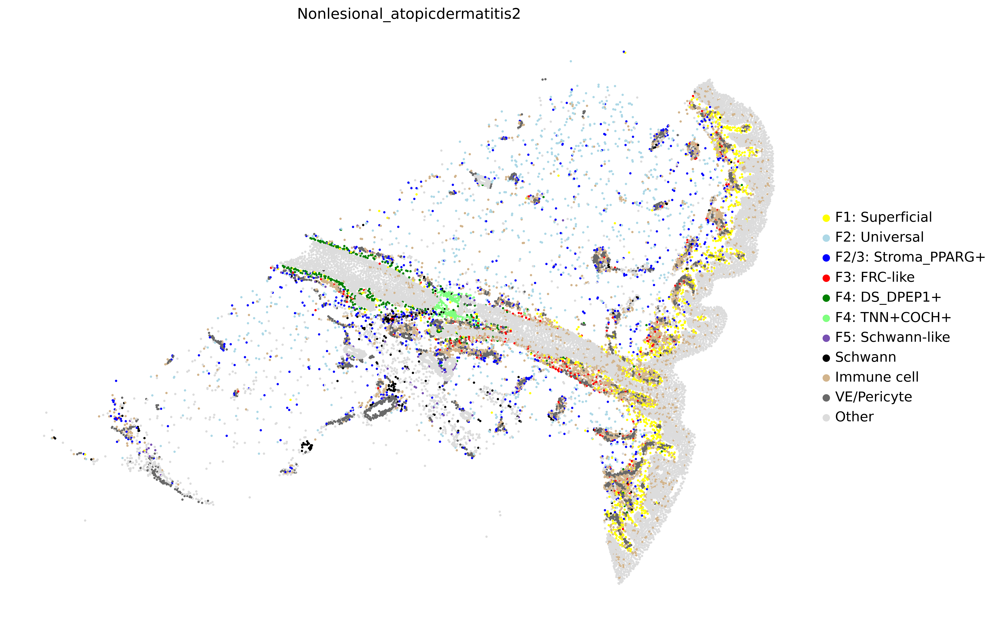

In [10]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
"""
all samples - broad immune cells (more specific immune cells below)
"""


CATEGORY = "celltypes_Fig2"
adata_5k=adata_5k[adata_5k.obs[CATEGORY]!="EXCLUDE"]

sc.settings.set_figure_params(dpi=300, facecolor="white", frameon=False, figsize=(13,13))

for SAMPLE_INDEX, sample in enumerate( [ "Nonlesional_atopicdermatitis1" ]):
    print(sample)

    adata_i_f_5k = adata_5k[adata_5k.obs["sample_id"] == sample]
    print(adata_i_f_5k.shape)
    try:
        adata_i_f_5k.uns.pop('specific_celltype4_colors')
    except:
        1  

    sq.pl.spatial_scatter(
        adata_i_f_5k,
        library_id="spatial",
        shape=None,
        color="celltypes_Fig2",
        title=sample  ,
        size=10,
       # save="_fig2umap1b.png"
    )
    
for SAMPLE_INDEX, sample in enumerate( [ "Nonlesional_atopicdermatitis2" ]):
    print(sample)
    adata_i_f_5k = adata_5k[adata_5k.obs["sample_id"] == sample]
    print(adata_i_f_5k.shape)
    try:
        adata_i_f_5k.uns.pop('specific_celltype4_colors')
    except:
        1  

    sq.pl.spatial_scatter(
        adata_i_f_5k,
        library_id="spatial",
        shape=None,
        color="celltypes_Fig2",
        title=sample  ,
        size=5,
      #  save="_fig2umap1a.png"
    )


 
   
sc.settings.set_figure_params(dpi=50, facecolor="white", frameon=False, figsize=(5,5))



# sfig2

In [11]:
sc.settings.figdir = "sfig2"


Dictionary successfully LOADED from /nfs/team298/ls34/fb_dict.pkl


/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(

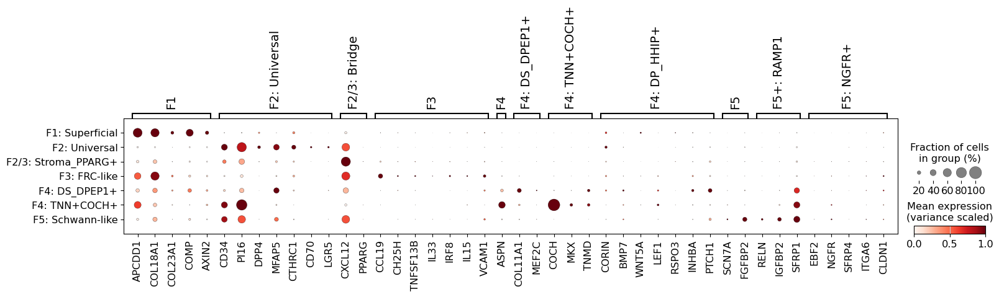

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_matrixplot.py:143: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  values_df = self.obs_tidy.groupby(level=0).mean()


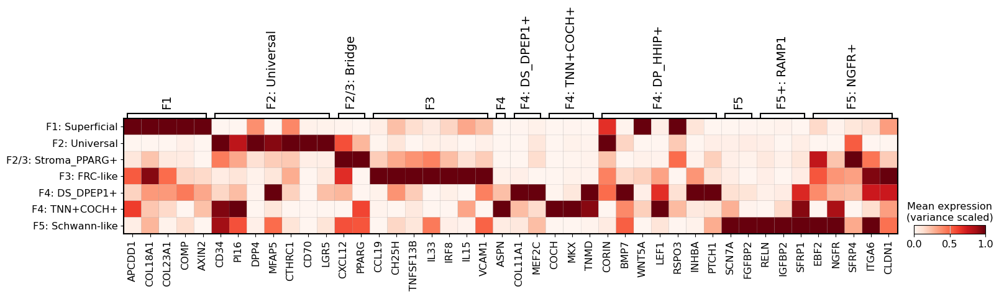

In [12]:
import pickle

file_path = '/nfs/team298/ls34/fb_dict.pkl'

with open(file_path, 'rb') as file:
    reynolds_short_final = pickle.load(file)

print(f"Dictionary successfully LOADED from {file_path}")

reynolds_short_final = {key: [gene for gene in genes if gene in adata_5k_fig2.var_names] 
                           for key, genes in reynolds_short_final.items()}

adata_5k_fig2_withfb = adata_5k_fig2[adata_5k_fig2.obs["celltypes_Fig2"].str.startswith("F")]

sc.pl.dotplot(
    adata_5k_fig2_withfb,
    reynolds_short_final,
    groupby="celltypes_Fig2",
    standard_scale="var",
    dendrogram=False,
    colorbar_title="Mean expression\n(variance scaled)",
    categories_order=  ['F1: Superficial', 'F2: Universal', 'F2/3: Stroma_PPARG+', 'F3: FRC-like', 'F4: DS_DPEP1+', 'F4: TNN+COCH+',
                        'F5: Schwann-like',]

) 
sc.pl.matrixplot(
    adata_5k_fig2_withfb,
    reynolds_short_final,
    groupby="celltypes_Fig2",
   standard_scale="var",
    vmax=1,cmap="Reds",
    dendrogram=False,
    
    colorbar_title="Mean expression\n(variance scaled)",
    categories_order=  ['F1: Superficial', 'F2: Universal', 'F2/3: Stroma_PPARG+', 'F3: FRC-like', 'F4: DS_DPEP1+', 'F4: TNN+COCH+',
                        'F5: Schwann-like',]

) 


/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(

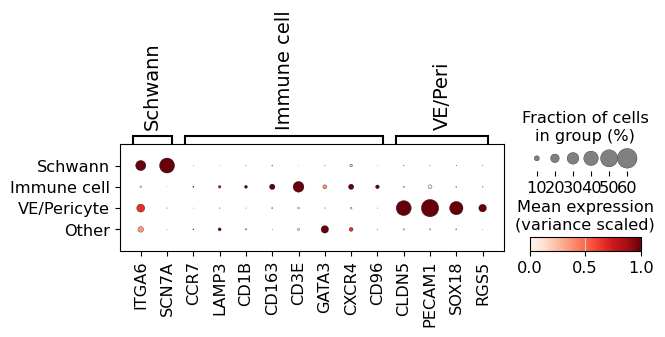

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_matrixplot.py:143: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  values_df = self.obs_tidy.groupby(level=0).mean()


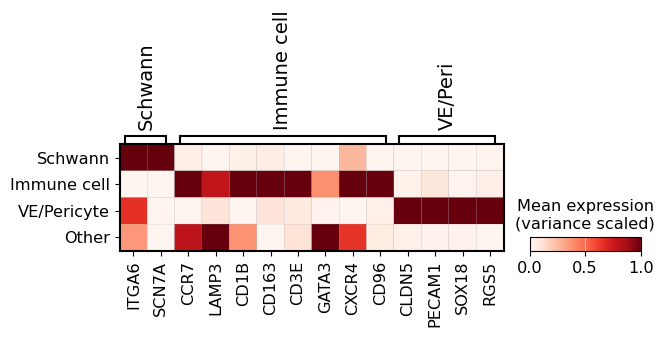

In [13]:
FIG6_GENES= {   "Schwann": ["ITGA6", "SCN7A"]   ,       
                "Immune cell": ["CCR7", "LAMP3", "CD1B", "CD163", "CD3E", "GATA3", "CXCR4", 'CD96'],
                    "VE/Peri": ["CLDN5", "PECAM1", "SOX18", "RGS5"],

              }
adata_5k_fig2_withoutfb = adata_5k_fig2[~adata_5k_fig2.obs["celltypes_Fig2"].str.startswith("F")]
 
sc.pl.dotplot(
    adata_5k_fig2_withoutfb,
    FIG6_GENES,
    groupby="celltypes_Fig2",
    standard_scale="var",
    dendrogram=False,
   #swap_axes=True,
    colorbar_title="Mean expression\n(variance scaled)"
) 
sc.pl.matrixplot(
    adata_5k_fig2_withoutfb,
    FIG6_GENES,
    groupby="celltypes_Fig2",
    standard_scale="var",cmap="Reds",
    dendrogram=False,
   #swap_axes=True,
    colorbar_title="Mean expression\n(variance scaled)"
) 

# fig 4

In [14]:
sc.settings.figdir = "fig4"


In [15]:
adata_5k.obs["sample_id"].value_counts()

sample_id
Public_cutaneousmelanoma         98755
Nonlesional_atopicdermatitis2    19988
Lesional_atopicdermatitis3       12330
Nonlesional_atopicdermatitis1     7669
Name: count, dtype: int64

In [16]:
adata_eczema = adata_5k[adata_5k.obs["sample_id"] == "Lesional_atopicdermatitis3"]

category_counts = adata_eczema.obs["celltypes_Fig4"].value_counts()

CATEGORY = "celltypes_Fig4"
KEEP_5k =[x for x in adata_5k.obs[CATEGORY].unique() if x.startswith("F") or x.startswith("Schw") or x.startswith("VE")
          or x.startswith("Immun")
         ]
KEEP_5k
adata_5k.obs["celltypes_Fig4"] = [x if x in KEEP_5k else "Other" for x in adata_5k.obs[CATEGORY]]

adata_5k.obs["celltypes_Fig4"].value_counts()
 

/tmp/ipykernel_29641/3461428865.py:13: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_5k.obs["celltypes_Fig4"] = [x if x in KEEP_5k else "Other" for x in adata_5k.obs[CATEGORY]]


celltypes_Fig4
Other                             75621
Immune cell                       37820
VE/Pericyte                        8830
F6: Myofibroblast                  4791
F6: Inflammatory myofibroblast     3048
F1: Superficial                    2459
F2: Universal                      2275
F2/3: Stroma_PPARG+                1685
Schwann                             720
F3: FRC-like                        583
F4: DS_DPEP1+                       399
F5: Schwann-like                    326
F4: TNN+COCH+                       185
Name: count, dtype: int64

Lesional_atopicdermatitis3


/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/squidpy/pl/_color_utils.py:27: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  target.uns[color_key] = source.uns[color_key]
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


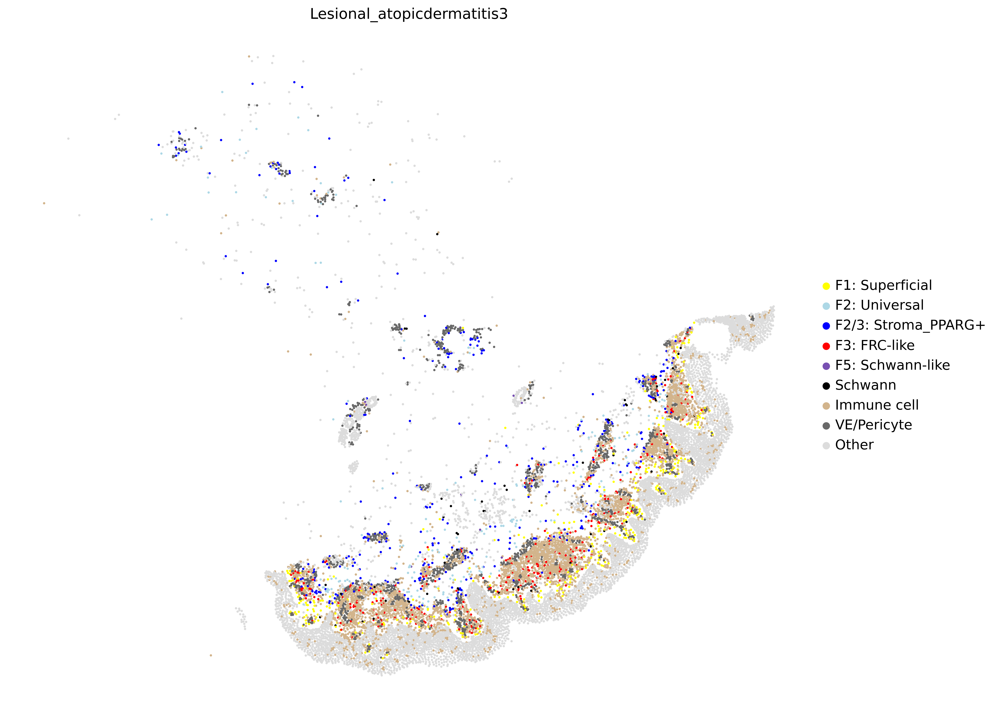

In [17]:
sc.settings.set_figure_params(dpi=300, facecolor="white", frameon=False, figsize=(13,13))

for SAMPLE_INDEX, sample in enumerate(["Lesional_atopicdermatitis3"]):
    print(sample)
    if "Lesional" in sample:
        try:
            adata_eczema.uns.pop('celltypes_Fig4_colors')
        except:
            1 
        sq.pl.spatial_scatter(
            adata_eczema,
            library_id="spatial",
            shape=None,
            color="celltypes_Fig2",
            title=sample,
            size=5,
            #save="_fig6umap_xenium.png"
        )

     

In [18]:
# import pickle

# file_path = '/nfs/team298/ls34/fb_dict.pkl'

# with open(file_path, 'rb') as file:
#     reynolds_short_final = pickle.load(file)

# print(f"Dictionary successfully LOADED from {file_path}")

# reynolds_short_final = {key: [gene for gene in genes if gene in adata_5k_fig2.var_names] 
#                            for key, genes in reynolds_short_final.items()}
# reynolds_short_final

In [19]:
sc.settings.figdir = "sfig4"


In [20]:
adata_eczema

AnnData object with n_obs × n_vars = 12330 × 5000
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'Site_status', 'celltypes_sFig4_melanoma', 'celltypes_sFig2', 'celltypes_Fig4', 'celltypes_Fig7', 'celltypes_Fig2', 'Niche_name', 'Donor_number', 'Disease', 'sample_id', 'celltypes_Fig4_melanoma'
    uns: 'fig6_new_colors', 'celltypes_Fig2_colors'
    obsm: 'spatial'
    layers: 'counts'

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(

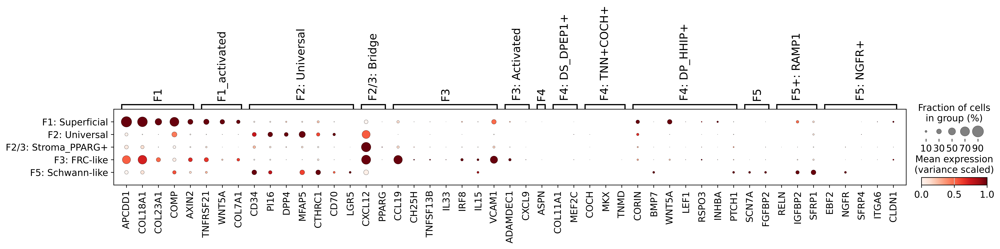

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_matrixplot.py:143: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  values_df = self.obs_tidy.groupby(level=0).mean()


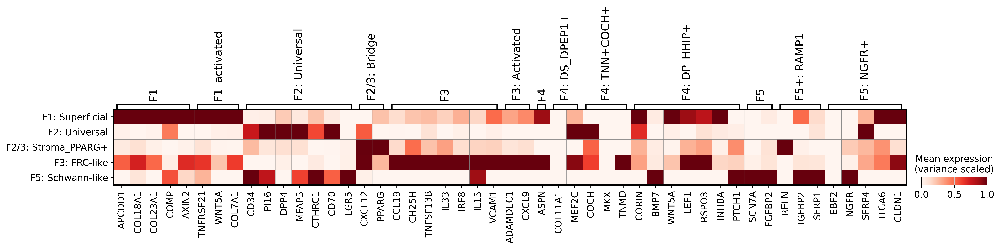

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_matrixplot.py:143: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  values_df = self.obs_tidy.groupby(level=0).mean()


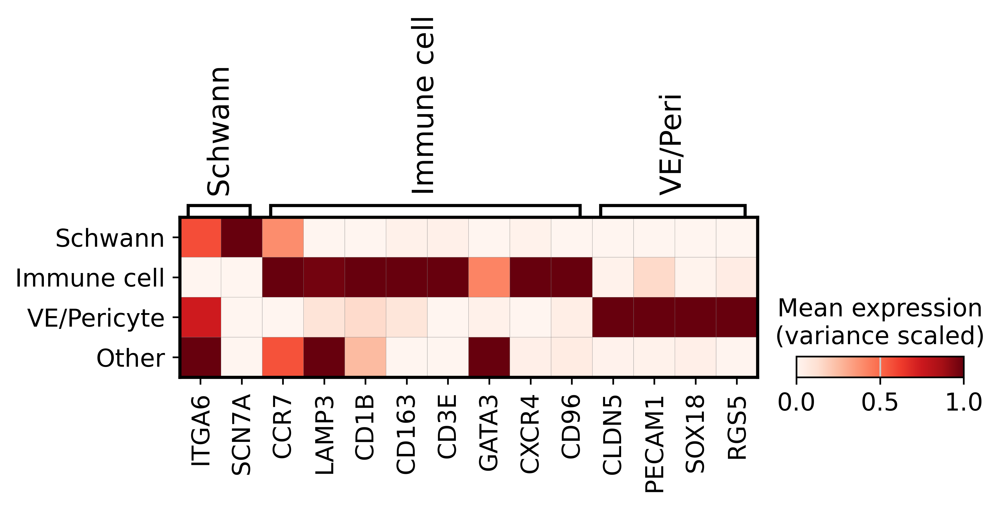

In [21]:
reynolds_short_final={'F1': ['APCDD1', 'COL18A1', 'COL23A1', 'COMP', 'AXIN2'],
 "F1_activated": [ 'TNFRSF21', 'WNT5A', 'COL7A1'],
 'F2: Universal': ['CD34', 'PI16', 'DPP4', 'MFAP5', 'CTHRC1', 'CD70', 'LGR5'],
 'F2/3: Bridge': ['CXCL12', 'PPARG'],
 'F3': ['CCL19', 'CH25H', 'TNFSF13B', 'IL33', 'IRF8', 'IL15', 'VCAM1'],
 "F3: Activated": ["ADAMDEC1", "CXCL9"],
 'F4': ['ASPN'],
 'F4: DS_DPEP1+': ['COL11A1', 'MEF2C'],
 'F4: TNN+COCH+': ['COCH', 'MKX', 'TNMD'],
 'F4: DP_HHIP+': ['CORIN', 'BMP7', 'WNT5A', 'LEF1', 'RSPO3', 'INHBA', 'PTCH1'],
 'F5': ['SCN7A', 'FGFBP2'],
 'F5+: RAMP1': ['RELN', 'IGFBP2', 'SFRP1'],
 'F5: NGFR+': ['EBF2', 'NGFR', 'SFRP4', 'ITGA6', 'CLDN1']}

adata_eczema2 = adata_eczema[adata_eczema.obs["celltypes_Fig2"].str.startswith("F")]

sc.pl.dotplot(
    adata_eczema2,
    reynolds_short_final,
    groupby="celltypes_Fig2",
    standard_scale="var",
    dendrogram=False,
    colorbar_title="Mean expression\n(variance scaled)",
    categories_order=  ['F1: Superficial', 'F2: Universal', 'F2/3: Stroma_PPARG+', 'F3: FRC-like', #'F4: DS_DPEP1+', 'F4: TNN+COCH+',
                        'F5: Schwann-like',]

) 
sc.pl.matrixplot(
    adata_eczema2,
    reynolds_short_final,
    groupby="celltypes_Fig2",
   standard_scale="var",
    vmax=1,cmap="Reds",
    dendrogram=False,
    
    colorbar_title="Mean expression\n(variance scaled)",
    categories_order=  ['F1: Superficial', 'F2: Universal', 'F2/3: Stroma_PPARG+', 'F3: FRC-like', #'F4: DS_DPEP1+', 'F4: TNN+COCH+',
                        'F5: Schwann-like',]

) 


kirstin= {   "Schwann": ["ITGA6", "SCN7A"]   ,       
                "Immune cell": ["CCR7", "LAMP3", "CD1B", "CD163", "CD3E", "GATA3", "CXCR4", 'CD96'],
                    "VE/Peri": ["CLDN5", "PECAM1", "SOX18", "RGS5"],

              }
kirstin = {key: [gene for gene in genes if gene in adata_i_f_5k.var_names] 
                           for key, genes in kirstin.items()}


adata_eczema2 = adata_eczema[~adata_eczema.obs["celltypes_Fig2"].str.startswith("F")]
sc.pl.matrixplot(
    adata_eczema2,
    kirstin,
    groupby="celltypes_Fig2",
   standard_scale="var",
    vmax=1,cmap="Reds",
    dendrogram=False,
    
    colorbar_title="Mean expression\n(variance scaled)",
 

) 
 

In [22]:
sc.settings.figdir = "fig4"


/tmp/ipykernel_29641/694268603.py:55: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


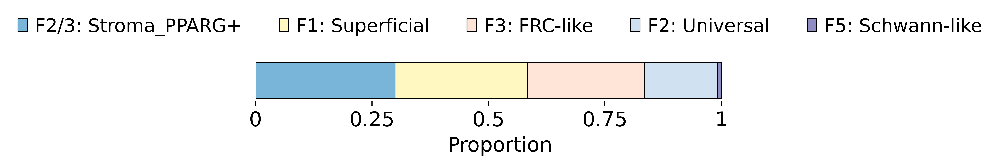

In [23]:
import matplotlib.pyplot as plt

custom_colors ={'F2: Universal': [0.81411765, 0.88392157, 0.94980392, 1.        ],
                F1_NAME: [1.        , 0.97244137, 0.75680123, 1.        ],
                  'F1: Regenerative': [1.        , 0.97244137, 0.75680123, 1.        ],
                'F3: FRC-like': [0.99692426, 0.89619377, 0.84890427, 1.        ],
                'F4': [0.50196078, 0.79058824, 0.50143791, 1.        ],
                F23_NAME: [0.47294118, 0.71163399, 0.85071895, 1.        ],
                'F5: Schwann-like': [0.56608997, 0.55218762, 0.75933872, 1.        ]

               }


adata_eczema_fbs = adata_eczema[adata_eczema.obs["celltypes_Fig2"].str.startswith("F")]
proportions = adata_eczema_fbs.obs['celltypes_Fig2'].value_counts(normalize=True)

proportions_filtered = proportions[proportions.index != 'Nonspecific']


fig, ax = plt.subplots(figsize=(6, 0.5))



previous_proportion = 0
for proportion, label in zip(proportions_filtered, proportions_filtered.index):
    color = custom_colors.get(label, '#D3D3D3')  # Default color for 'Other'
    ax.barh([1], [proportion], left=previous_proportion, color=color, label=label,
            linewidth=0.5,   
         edgecolor='black',  )
    previous_proportion += proportion

# Create legend above the plot, ordered by highest proportion
handles, labels = ax.get_legend_handles_labels()
unique_labels = dict(zip(labels, handles))  # Remove duplicates
ax.legend(unique_labels.values(), unique_labels.keys(), loc='lower center', bbox_to_anchor=(0.5, 1.2),
          ncol=len(unique_labels), frameon=False)

# Remove axes
ax.set_yticks([])
ax.set_xticks([0, 0.25, 0.5, 0.75, 1.0])
ax.set_xticklabels(['0', '0.25', '0.5', '0.75', '1'])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Remove axis labels
ax.set_ylabel('')
ax.set_xlabel('Proportion')

# Remove grid
ax.grid(False)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()
 

/tmp/ipykernel_29641/2355469030.py:36: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


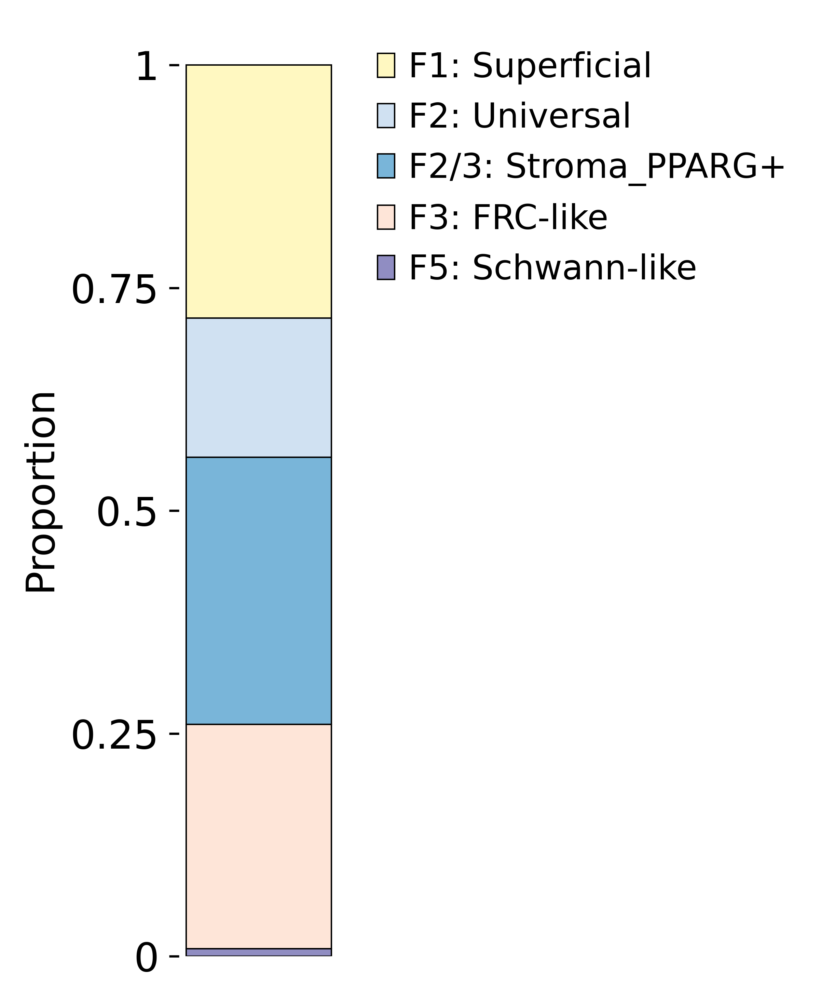

In [24]:
desired_order = [F1_NAME, 'F2: Universal', F23_NAME, 'F3: FRC-like', 'F5: Schwann-like']
desired_order = desired_order[::-1]

proportions_filtered = proportions_filtered.reindex(desired_order)

fig, ax = plt.subplots(figsize=(1, 6))  

previous_proportion = 0
for proportion, label in zip(proportions_filtered, proportions_filtered.index):
    color = custom_colors.get(label, '#D3D3D3')   
    ax.bar([1], [proportion], bottom=previous_proportion, color=color, label=label,
                   linewidth=0.5,   
        width=0.5,        edgecolor='black',  

           
          )
    previous_proportion += proportion

handles, labels = ax.get_legend_handles_labels()
unique_labels = dict(zip(labels, handles))  
ax.legend(unique_labels.values(), unique_labels.keys(), loc='upper left', bbox_to_anchor=(1, 1),
          frameon=False)

ax.set_xticks([])
ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
ax.set_yticklabels(['0', '0.25', '0.5', '0.75', '1'])
ax.set_ylabel('Proportion')
ax.set_xlabel('')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

ax.grid(False)
plt.tight_layout()
handles, labels = ax.get_legend_handles_labels()
ax.legend(reversed(handles), reversed(labels), bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False, fontsize=12)
plt.show()

 

# MELANOMA

In [25]:
# RENAME = {'KC': 'Other',
#  'T': 'T',
#  'Other myeloid': 'Other immune cell',
#  'Melanoma': 'Melanoma',
#  'F1: Superficial': 'F1: Superficial',
#  'F6: Inflammatory myofibroblast': 'F6: Inflammatory myofibroblast',
#  'F6: Myofibroblast': 'F6: Myofibroblast',
#  'Bcell/plasma cell':  'Bcell/plasma cell',
#  'VE/Pericyte': 'VE/Pericyte',
#  'LE': 'Other',
#  'F2/3: Bridge': 'F2/3: Bridge',
#  'Melanocyte': 'Other',
#  'F2: Universal': 'F2: Universal',
#  'F3: TRC-like': 'F3: FRC-like',
#  'Mast cell': 'Immune cell',
#  'Treg': 'T',
#  'Schwann': 'Schwann',
#  'KC_HF':  'Other',
#  'KC_Sebocyte': 'Other',
#  'Sweat gland': 'Other',
#  'Adipocyte': 'Other',
#  'Muscle': 'Other',
#  'F4: DS_DPEP1+': 'F4: DS_DPEP1+',
#  'F5: Schwann-like': 'F5: Schwann-like',
#  'Nonspecific': 'Other',
#  'F4: TNN+COCH+': 'F4: TNN+COCH+',
#  'MigDC': 'Other immune cell'
#          }

# adata_5k.obs['celltypes_Fig4_melanoma'] = adata_5k.obs['celltypes_sFig4_melanoma'].map(RENAME)

In [26]:
# RENAME = {'KC': 'Other',
#  'T': 'Immune cell',
#  'Other myeloid': 'Immune cell',
#  'Melanoma': 'Melanoma',
#  'F1: Superficial': 'F1: Superficial',
#  'F6: Inflammatory myofibroblast': 'F6: Inflammatory myofibroblast',
#  'F6: Myofibroblast': 'F6: Myofibroblast',
#  'Bcell/plasma cell':  'Immune cell',
#  'VE/Pericyte': 'VE/Pericyte',
#  'LE': 'Other',
#  'F2/3: Bridge': 'F2/3: Bridge',
#  'Melanocyte': 'Other',
#  'F2: Universal': 'F2: Universal',
#  'F3: TRC-like': 'F3: FRC-like',
#  'Mast cell': 'Immune cell',
#  'Treg': 'Immune cell',
#  'Schwann': 'Schwann',
#  'KC_HF':  'Other',
#  'KC_Sebocyte': 'Other',
#  'Sweat gland': 'Other',
#  'Adipocyte': 'Other',
#  'Muscle': 'Other',
#  'F4: DS_DPEP1+': 'F4: DS_DPEP1+',
#  'F5: Schwann-like': 'F5: Schwann-like',
#  'Nonspecific': 'Other',
#  'F4: TNN+COCH+': 'F4: TNN+COCH+',
#  'MigDC': 'Immune cell'}

# adata_5k.obs['celltypes_Fig4_melanoma'] = adata_5k.obs['celltypes_sFig4_melanoma'].map(RENAME)

In [27]:
adata=adata_5k[adata_5k.obs["sample_id"]=="Public_cutaneousmelanoma"].copy()


In [28]:
mm_colors =  {
        'Melanoma': '#5C4033',   
     F6I: '#01ffff',  
      'F6: Myofibroblast': '#55aaff',   
    "Bcell/plasma cell": "#FF69B4"

}
color_map_5k = color_map_5k | mm_colors

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


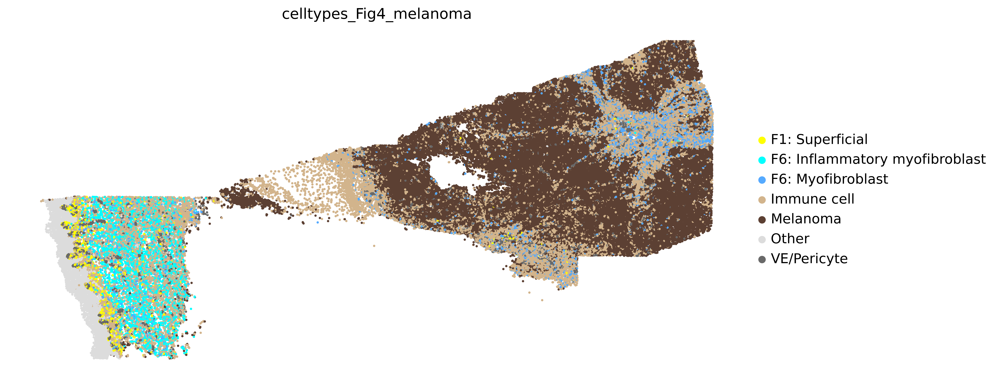

In [29]:
CATEGORY="celltypes_Fig4_melanoma"
try:
    adata.uns.pop(CATEGORY + "_colors")
except:
    1 
adata.obs[CATEGORY] =  adata.obs[CATEGORY].astype('category')
adata.uns[CATEGORY+"_colors"] = [color_map_5k[x] for x in adata.obs[CATEGORY].cat.categories]

sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=CATEGORY,
    #title=sample,
    size=5,
    #save="fig4_melanoma.png"
)

/tmp/ipykernel_29641/1472004305.py:50: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


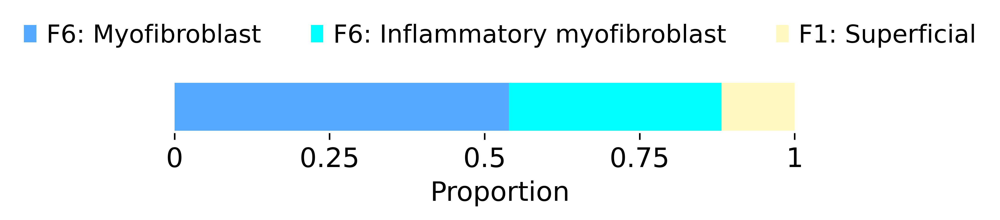

In [30]:
custom_colors ={'F2: Universal': [0.81411765, 0.88392157, 0.94980392, 1.        ],
                F1_NAME: [1.        , 0.97244137, 0.75680123, 1.        ],
                  'F1: Regenerative': [1.        , 0.97244137, 0.75680123, 1.        ],
                'F3: FRC-like': [0.99692426, 0.89619377, 0.84890427, 1.        ],
                'F4': [0.50196078, 0.79058824, 0.50143791, 1.        ],
                F23_NAME: [0.47294118, 0.71163399, 0.85071895, 1.        ],
                'F5: Schwann-like': [0.56608997, 0.55218762, 0.75933872, 1.        ],
                F6I:     '#01ffff',  # cyan
                "F6: Myofibroblast":  '#55aaff',  # light blue

               }


adata_mm_fbs = adata[adata.obs[CATEGORY].str.startswith("F")]
proportions = adata_mm_fbs.obs[CATEGORY].value_counts(normalize=True)

proportions_filtered = proportions[proportions.index != 'Nonspecific']


fig, ax = plt.subplots(figsize=(6, 0.5))



previous_proportion = 0
for proportion, label in zip(proportions_filtered, proportions_filtered.index):
    color = custom_colors.get(label, '#D3D3D3')  
    ax.barh([1], [proportion], left=previous_proportion, color=color, label=label)
    previous_proportion += proportion


handles, labels = ax.get_legend_handles_labels()
unique_labels = dict(zip(labels, handles))   
ax.legend(unique_labels.values(), unique_labels.keys(), loc='lower center', bbox_to_anchor=(0.5, 1.2),
          ncol=len(unique_labels), frameon=False)


ax.set_yticks([])
ax.set_xticks([0, 0.25, 0.5, 0.75, 1.0])
ax.set_xticklabels(['0', '0.25', '0.5', '0.75', '1'])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

ax.set_ylabel('')
ax.set_xlabel('Proportion')

ax.grid(False)

plt.tight_layout()

plt.show()


/tmp/ipykernel_29641/2521201488.py:33: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


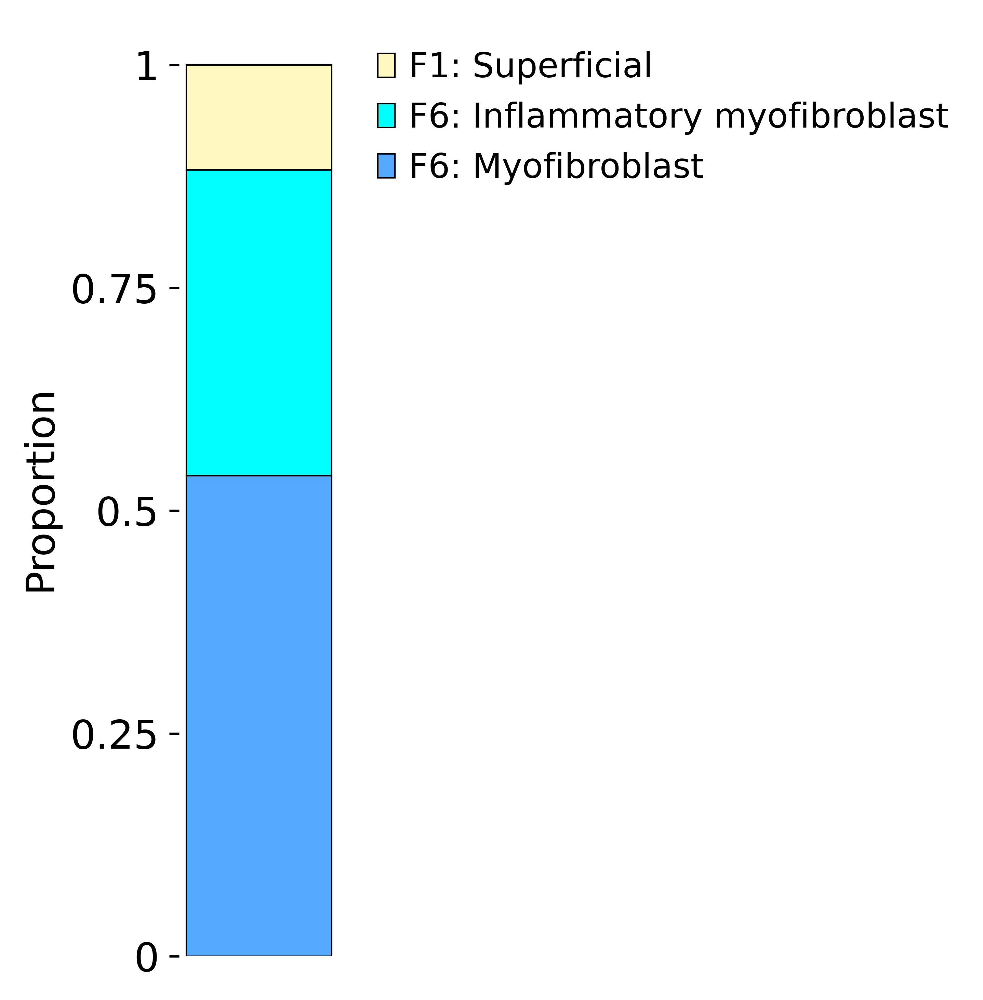

In [31]:
fig, ax = plt.subplots(figsize=(1, 6))   

previous_proportion = 0
for proportion, label in zip(proportions_filtered, proportions_filtered.index):
    color = custom_colors.get(label, '#D3D3D3')  
    ax.bar([1], [proportion], bottom=previous_proportion, color=color, label=label,
                   linewidth=0.5,   
        width=0.5,        edgecolor='black', 
           

           
          )
    previous_proportion += proportion

    handles, labels = ax.get_legend_handles_labels()
unique_labels = dict(zip(labels, handles))   
ax.legend(unique_labels.values(), unique_labels.keys(), loc='upper left', bbox_to_anchor=(1, 1),
          frameon=False)

ax.set_xticks([])
ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
ax.set_yticklabels(['0', '0.25', '0.5', '0.75', '1'])
ax.set_ylabel('Proportion')
ax.set_xlabel('')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

ax.grid(False)

plt.tight_layout()

handles, labels = ax.get_legend_handles_labels()
ax.legend(reversed(handles), reversed(labels), bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False, fontsize=12)

plt.show()



In [32]:
sc.settings.figdir = "sfig4"


In [ ]:
CELL_TYPE="Bcell/plasma cell"



custom_palette = {
    CELL_TYPE: "#00008B",  
    "Other": "#D3D3D3"  
}

adata.obs["fig6_colored"] = [x if x == CELL_TYPE else "Other" for x in adata.obs["celltypes_sFig4_melanoma"]]

adata.obs["fig6_colored"] .value_counts()
adata.obs["fig6_colored"]=adata.obs["fig6_colored"].astype('category')

adata.uns['fig6_colored_colors'] = [custom_palette[cat] for cat in adata.obs["fig6_colored"].cat.categories]


sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color="fig6_colored",
    title=sample,
    size=1
)



/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


In [ ]:
CELL_TYPE="Melanoma"



custom_palette = {
    CELL_TYPE:  "#5C4033",  
    "Other": "#D3D3D3"   
}
adata.obs["fig6_colored"] = [x if x == CELL_TYPE else "Other" for x in adata.obs["celltypes_sFig4_melanoma"]]

adata.obs["fig6_colored"] .value_counts()
adata.obs["fig6_colored"]=adata.obs["fig6_colored"].astype('category')
adata.uns['fig6_colored_colors'] = [custom_palette[cat] for cat in adata.obs["fig6_colored"].cat.categories]

sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color="fig6_colored",
    title=sample,
    size=1,
   # save="umap_melanomaALONE.png"
)



In [ ]:
CELL_TYPE="T"

custom_palette = {
    CELL_TYPE: "#00008B",  
    "Other": "#D3D3D3"   
}

adata.obs["fig6_colored"] = [x if x == CELL_TYPE else "Other" for x in adata.obs["celltypes_sFig4_melanoma"]]

adata.obs["fig6_colored"] .value_counts()
adata.obs["fig6_colored"]=adata.obs["fig6_colored"].astype('category')
adata.uns['fig6_colored_colors'] = [custom_palette[cat] for cat in adata.obs["fig6_colored"].cat.categories]

sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color="fig6_colored",
    title=sample,
    size=5
)



In [ ]:
import pickle

file_path = '/nfs/team298/ls34/fb_dict_lesional.pkl'

with open(file_path, 'rb') as file:
    lesional_genes = pickle.load(file)

print(f"Dictionary successfully LOADED from {file_path}")

lesional_genes = {key: [gene for gene in genes if gene in adata_5k_fig2.var_names] 
                           for key, genes in lesional_genes.items()}
lesional_genes

In [ ]:
adata_mm = adata[adata.obs["celltypes_Fig4_melanoma"].str.startswith("F")]

sc.pl.matrixplot(
    adata_mm,
    lesional_genes,
    groupby="celltypes_sFig4_melanoma",
   #standard_scale="var",
    vmax=0.3,cmap="Reds",
    dendrogram=False,
    
    colorbar_title="Mean expression\n(log1p norm)",
    categories_order=  ['F1: Superficial','F6: Inflammatory myofibroblast',  'F6: Myofibroblast', ])


In [ ]:
lesional_genes = {'F3': ['CCL19', 'CH25H'],
 'F1': ['COL18A1', 'COL23A1', 'COMP', 'TNFRSF21'],
 'F1+F6:My_Inf': ['WNT5A', 'COL7A1'],
 'F6: Myofibroblast inflammatory': ['CXCL5',
  'CXCL6',
  'CXCL13',
  'IL11',
  'IL24',
  'INHBA',
  'CSF3',
  'TDO2',
  'WWC1',
  'STAT4',
  'CCL11'],
 'F6 (both)': ['WNT2', 'COL10A1'],
 'F6(both)+F7': ['ASPN',
  'ZNF469',
  'RUNX2',
  'SULF1',
  'ADAM12',
  'LRRC15',
  'CTHRC1',
  'CCN4',
  'CDH2'],
 'F6: MyoFb + F7': ['PIEZO2', 'SFRP4', 'KCNMA1'],
                 }
adata_mm = adata[adata.obs["celltypes_Fig4_melanoma"].str.startswith("F")]


sc.pl.matrixplot(
    adata_mm,
    lesional_genes,
    groupby="celltypes_sFig4_melanoma",
   #standard_scale="var",
    vmax=0.3,cmap="Reds",
    dendrogram=False,
    
    colorbar_title="Mean expression\n(log1p norm)",
    categories_order=  ['F1: Superficial','F6: Inflammatory myofibroblast',  'F6: Myofibroblast', ])


In [ ]:
adata_mm = adata[adata.obs["celltypes_Fig4_melanoma"].str.startswith("F")]


sc.pl.matrixplot(
    adata_mm,
    lesional_genes,
    groupby="celltypes_sFig4_melanoma",
   #standard_scale="var",
    vmax=0.3,cmap="Reds",
    dendrogram=False,
    
    colorbar_title="Mean expression\n(log1p norm)",
    categories_order=  ['F1: Superficial', 'F6: Inflammatory myofibroblast',  'F6: Myofibroblast', ])

sc.pl.matrixplot(
    adata_mm,
    lesional_genes,
    groupby="celltypes_sFig4_melanoma",
   standard_scale="var",
    vmax=1,cmap="Reds",
    dendrogram=False,
    
    colorbar_title="Mean expression\n(variance scaled)",
    categories_order=  ['F1: Superficial', 'F6: Inflammatory myofibroblast',  'F6: Myofibroblast', ]

) 



In [ ]:
adata_mm = adata[~adata.obs["celltypes_sFig4_melanoma"].str.startswith("F")]
adata_mm = adata_mm[(adata_mm.obs["celltypes_sFig4_melanoma"].str.startswith("B"))|
        (adata_mm.obs["celltypes_sFig4_melanoma"].str.startswith("M"))]


 


BCELL_MM_GENES = {"Bcell/plasma cell": ["MZB1", "CD79A", "POU2AF1", "IGHE"],
                 "Melanoma": ["MLANA", 'PRAME', 'SOX10', "S100A1"],
                 }

sc.pl.matrixplot(
    adata_mm,
    BCELL_MM_GENES,
    groupby="celltypes_sFig4_melanoma",
  # standard_scale="var",
    vmax=0.5,cmap="Reds",
    vmin=0,
    dendrogram=False,
    
    colorbar_title="Mean expression\n(log1p norm)",
 

) 


sc.pl.matrixplot(
    adata_mm,
    BCELL_MM_GENES,
    groupby="celltypes_sFig4_melanoma",
      standard_scale="var",
    vmax=1,cmap="Reds",
    vmin=0,
    dendrogram=False,
    
    colorbar_title="Mean expression\n(variance scaled)",
 

) 

# Fig 7

In [ ]:
sc.settings.figdir = "fig7"


In [ ]:
adata_5k.obs["celltypes_Fig7"].value_counts()

In [ ]:
KEEP_5k_new = [F23_NAME,
 'Other immune cell',
 'F2: Universal',
 'VE/Pericyte',
 'F3: FRC-like',
 F1_NAME,
 'Schwann',
 'F4: Mixed',
 'F5: Schwann-like',
 'F4: TNN+COCH+', 'MigDC', 'Tcell', 'T']

color_map_5k_new = {'F3: FRC-like': '#FF0000',
 F23_NAME: '#0000FF',
 'F5: Schwann-like': '#7850b2',
 'VE/Pericyte': '#696969',
 'F2: Universal': '#ADD8E6',
 F1_NAME: '#FFFF00',
                     'F1: Regenerative': '#FFFF00',
 'Schwann': '#000000',
 'F4: Mixed': '#008000',
 'F4: TNN+COCH+': '#80ff80',
 'Other': '#DCDCDC',
 'Other immune cell': '#D2B48C',
    "T": "#654321",
                    "MigDC": "#00FF00"
                   
                   }
sc.settings.set_figure_params(dpi=300, facecolor="white", frameon=False, figsize=(13,13))

CATEGORY="celltypes_Fig7"

adata_5k.obs["celltypes_Fig7"] = [x if x in KEEP_5k_new else "Other" for x in adata_5k.obs[CATEGORY]]

adata_5k.obs["celltypes_Fig7"] =  adata_5k.obs["celltypes_Fig7"].astype('category')
adata_5k.uns['celltypes_Fig7_colors'] = [color_map_5k_new[x] for x in adata_5k.obs["celltypes_Fig7"].cat.categories]
 

for SAMPLE_INDEX, sample in enumerate(["Lesional_atopicdermatitis3"]):
    if "Lesional" in sample:

        adata_eczema = adata_5k[adata_5k.obs["sample_id"] == "Lesional_atopicdermatitis3"]
        category_counts = adata_eczema.obs['celltypes_Fig7'].value_counts()

        categories_to_keep = category_counts[category_counts >= 10].index.tolist()
        adata_eczema = adata_eczema[adata_eczema.obs['celltypes_Fig7'].isin(categories_to_keep)].copy()


#         try:
#             adata_eczema.uns.pop('celltypes_Fig7_colors')
#         except:
#             1 

        sq.pl.spatial_scatter(
            adata_eczema,
            library_id="spatial",
            shape=None,
            color="celltypes_Fig7",
            title=sample,
            size=5,
            #save="_fig6umap_xenium_withbox.png"
        )

        ax = plt.gca()
        plt.show()

In [ ]:
# # KEEP_5k_new = [F23_NAME,
# #  'Other immune cell',
# #  'F2: Universal',
# #  'VE/Pericyte',
# #  'F3: FRC-like',
# #  F1_NAME,
# #  'Schwann',
# #  'F4: Mixed',
# #  'F5: Schwann-like',
# #  'F4: TNN+COCH+', 'MigDC', 'Tcell', 'T']

# # color_map_5k_new = {'F3: FRC-like': '#FF0000',
# #  F23_NAME: '#0000FF',
# #  'F5: Schwann-like': '#7850b2',
# #  'VE/Pericyte': '#696969',
# #  'F2: Universal': '#ADD8E6',
# #  F1_NAME: '#FFFF00',
# #                      'F1: Regenerative': '#FFFF00',
# #  'Schwann': '#000000',
# #  'F4: Mixed': '#008000',
# #  'F4: TNN+COCH+': '#80ff80',
# #  'Other': '#DCDCDC',
# #  'Other immune cell': '#D2B48C',
# #     "T": "#654321",
# #                     "MigDC": "#00FF00"
                   
# #                    }
# # sc.settings.set_figure_params(dpi=300, facecolor="white", frameon=False, figsize=(13,13))



# # adata_5k.obs["celltypes_Fig7"] = [x if x in KEEP_5k_new else "Other" for x in adata_5k.obs[CATEGORY]]

# # adata_5k.obs["celltypes_Fig7"] =  adata_5k.obs["celltypes_Fig7"].astype('category')
# # adata_5k.uns['celltypes_Fig7_colors'] = [color_map_5k_new[x] for x in adata_5k.obs["celltypes_Fig7"].cat.categories]
 

# # for SAMPLE_INDEX, sample in enumerate(["Lesional_atopicdermatitis3"]):
# #     if "Lesional" in sample:

# #         adata_eczema = adata_5k[adata_5k.obs["sample_id"] == "Lesional_atopicdermatitis3"]
# #         category_counts = adata_eczema.obs['celltypes_Fig7'].value_counts()

# #         categories_to_keep = category_counts[category_counts >= 10].index.tolist()
# #         adata_eczema = adata_eczema[adata_eczema.obs['celltypes_Fig7'].isin(categories_to_keep)].copy()


# #         try:
# #             adata_eczema.uns.pop('celltypes_Fig7_colors')
# #         except:
# #             1 
            
 
# #         sq.pl.spatial_scatter(
# #             adata_eczema,
# #             library_id="spatial",
# #             shape=None,
# #             color="celltypes_Fig7",
# #             title=sample,
# #             size=5,
# #           #  save="_fig6umap_xenium_withbox.png"
# #         )

# for SAMPLE_INDEX, sample in enumerate(["Lesional_atopicdermatitis3"]):
#     if "Lesional" in sample:

#         adata_eczema = adata_5k[adata_5k.obs["sample_id"] == "Lesional_atopicdermatitis3"]
#         category_counts = adata_eczema.obs['celltypes_Fig7'].value_counts()

#         categories_to_keep = category_counts[category_counts >= 10].index.tolist()
#         adata_eczema = adata_eczema[adata_eczema.obs['celltypes_Fig7'].isin(categories_to_keep)].copy()


# #         try:
# #             adata_eczema.uns.pop('celltypes_Fig7_colors')
# #         except:
# #             1 

#         sq.pl.spatial_scatter(
#             adata_eczema,
#             library_id="spatial",
#             shape=None,
#             color="celltypes_Fig7",
#             title=sample,
#             size=5,
#             #save="_fig6umap_xenium_withbox.png"
#         )

#         ax = plt.gca()

        


#         ax.vlines(2420, ymin=2850, ymax=3100, color='r', linestyle='--')
#         ax.vlines(2720, ymin=2850, ymax=3100, color='r', linestyle='--')

#         ax.hlines(2850, xmin=2420, xmax=2720, color='r', linestyle='--')
#         ax.hlines(3100, xmin=2420, xmax=2720, color='r', linestyle='--')

#         plt.show()

In [ ]:


# CATEGORY="fig6_new"


# adata_5k.obs["fig6_new"] = [x if x in KEEP_5k_new else "Other" for x in adata_5k.obs[CATEGORY]]
# adata_5k.obs["fig6_new"].value_counts()
# #adata_i_f_skin.obs["specific_celltype4"] =  adata_i_f_skin.obs["specific_celltype4"].astype('category')
# adata_5k.obs[CATEGORY] =  adata_5k.obs[CATEGORY].astype('category')
# # Assign the colors to the uns attribute
# #adata_i_f_skin.uns['specific_celltype4_colors'] = [color_map_skin[x] for x in adata_i_f_skin.obs["specific_celltype4"].cat.categories]
# adata_5k.uns['fig6_new_colors'] = [color_map_5k_new[x] for x in adata_5k.obs['fig6_new'].cat.categories]
 

# for SAMPLE_INDEX, sample in enumerate(["BK25_Lesional"]):
#     if "Lesional" in sample:
#    # if "Week 12" in sample:

#         adata_eczema = adata_5k[adata_5k.obs["info_id"] == "BK25_Lesional Baseline"]
#         #print(adata_i_f_5k.shape)
#         #adata_i_f_skin = adata_skin[adata_skin.obs["info_id"] == LIST_OF_SAMPLES[SAMPLE_INDEX]]

#         try:
#             adata_eczema.uns.pop('specific_celltype4_colors')
#         except:
#             1 #print("not needed")

#         # Assign the categories or "Other" to the specific_celltype4 column
#         #adata_i_f_skin.obs["specific_celltype4"] = [x if x in KEEP_SKIN else "Other" for x in adata_i_f_skin.obs[CATEGORY]]

#         import squidpy as sq
#         import matplotlib.pyplot as plt

#         # Generate the full spatial scatter plot first
#         sq.pl.spatial_scatter(
#             adata_eczema,
#             library_id="spatial",
#             shape=None,
#             color="fig6_new",
#             title=sample,
#             size=5,
#             #save="_fig6umap_xenium_withbox.png"
#         )

# #         # Get the current axis
# #         ax = plt.gca()

# #         # Plot vertical dashed lines only within the y-range of the square
# #         ax.vlines(2420, ymin=2850, ymax=3100, color='r', linestyle='--')
# #         ax.vlines(2720, ymin=2850, ymax=3100, color='r', linestyle='--')

# #         # Plot horizontal dashed lines only within the x-range of the square
# #         ax.hlines(2850, xmin=2420, xmax=2720, color='r', linestyle='--')
# #         ax.hlines(3100, xmin=2420, xmax=2720, color='r', linestyle='--')

# #         # Show the plot with the square-only lines
# #         plt.show()

In [ ]:
# adata_eczema.obs["fig6_new"].value_counts()

In [ ]:
# KEEP_5k  = ['T', 'Mac', 'cDC', 'MigDC', 'F1: Regenerative', 'F3: FRC-like', 'F2/3: Bridge', 'VE/Pericyte', 'F2: Universal', 'Other', 'F5: Schwann-like', 'F4: Mixed', 'F4: TNN+COCH+']
# KEEP_5k

In [ ]:
# for x in KEEP_5k:
#     if x not in color_map_5k.keys():
#         print(x)
    


In [ ]:
color_map_5k.update({
    'T': '#c3aa85',                
    'Mac': '#FFA500',              
    'cDC': '#3CB371',               
    'MigDC': '#8B4513',             
    F1_NAME: '#FFFF00', 
})

In [ ]:
# sq.pl.spatial_scatter(
#     adata_eczema,
#     library_id="spatial",
#     shape=None,
#     color="celltypes_Fig7",
#     title=sample,
#     size=5,
# )


# ax = plt.gca()


# ax.vlines(2420, ymin=2850, ymax=3100, color='r', linestyle='--')
# ax.vlines(2720, ymin=2850, ymax=3100, color='r', linestyle='--')


# ax.hlines(2850, xmin=2420, xmax=2720, color='r', linestyle='--')
# ax.hlines(3100, xmin=2420, xmax=2720, color='r', linestyle='--')


# plt.show()

In [ ]:
# x_min, x_max = 2420, 2720
# y_min, y_max = 2850, 3100

# in_box = (
#     (adata_eczema.obs['x_centroid'] >= x_min) & (adata_eczema.obs['x_centroid'] <= x_max) &
#     (adata_eczema.obs['y_centroid'] >= y_min) & (adata_eczema.obs['y_centroid'] <= y_max)
# )

# adata_box = adata_eczema[in_box].copy()

# print(f"Subset contains {adata_box.shape[0]} cells in the box.")
# sq.pl.spatial_scatter(
#     adata_eczema,
#     library_id="spatial",
#     shape=None,
#     color="celltypes_Fig7",
#     title=sample,
#     size=5,
# )



In [ ]:
# adata_eczema2 = adata_eczema[adata_eczema.obs["fig2"].str.startswith("F")]

# sc.pl.dotplot(
#         adata_eczema2,
#         "IL33",
#         groupby="fig2",
#        # vmax=0.2,
#     dot_max=0.2,
#     standard_scale="var",
#             colorbar_title="Mean expression\n(log1p norm)",

#    # standard_scale="var",
#         dendrogram=False,
#     )  
# sc.pl.dotplot(
#         adata_eczema2,
#         "IL33",
#         groupby="fig2",
#      vmax=0.2,
#     dot_max=0.1,
#    # standard_scale="var",
#             colorbar_title="Mean expression\n(log1p norm)",

#    # standard_scale="var",
#         dendrogram=False,
#     )  


In [ ]:
# import pandas as pd
# import matplotlib.pyplot as plt

# # Calculate the total counts for each group in "fig6"
# group_counts = adata_box.obs["fig2"].value_counts()

# # Create the bar plot
# plt.figure(figsize=(10, 6))
# group_counts.plot(kind='bar')

# # Customize the plot
# plt.xlabel("Group")
# plt.ylabel("Total Counts")
# plt.title("Total Counts for Each Group in fig6")
# plt.xticks(rotation=45, ha='right')  # Rotate x-ticks for readability
# plt.tight_layout()  # Adjust layout to fit everything

# # Show the plot
# plt.show()

In [ ]:
# proportions = adata_box.obs['celltypes_Fig7'].value_counts(normalize=True)
# proportions

In [ ]:
# proportions_filtered = proportions[proportions.index != 'Nonspecific']
# other_proportion = proportions_filtered[proportions_filtered < 0.005].sum()
# proportions_filtered = proportions_filtered[proportions_filtered >= 0.005]

# # Step 3: Add the 'Other' category if there are any small proportions
# if other_proportion > 0:
#     proportions_filtered['Other'] = other_proportion

# # Step 4: Normalize the proportions to sum to 1
# proportions_filtered = proportions_filtered / proportions_filtered.sum()

# # Step 5: Sort proportions by descending order
# proportions_filtered = proportions_filtered.sort_values(ascending=False)

# # Step 6: Plotting
# fig, ax = plt.subplots(figsize=(6, 0.5))

# previous_proportion = 0
# for proportion, label in zip(proportions_filtered, proportions_filtered.index):
#     color = color_map_5k.get(label, '#D3D3D3')  # Default color for 'Other'
#     ax.barh([1], [proportion], left=previous_proportion, color=color, label=label)
#     previous_proportion += proportion

# # Create legend above the plot, ordered by highest proportion
# handles, labels = ax.get_legend_handles_labels()
# unique_labels = dict(zip(labels, handles))  # Remove duplicates
# ax.legend(unique_labels.values(), unique_labels.keys(), loc='lower center', bbox_to_anchor=(0.5, 1.2),
#           ncol=len(unique_labels), frameon=False)

# # Remove axes
# ax.set_yticks([])
# ax.set_xticks([0, 0.25, 0.5, 0.75, 1.0])
# ax.set_xticklabels(['0', '0.25', '0.5', '0.75', '1'])
# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['bottom'].set_visible(False)

# # Remove axis labels
# ax.set_ylabel('')
# ax.set_xlabel('Proportion')

# # Remove grid
# ax.grid(False)

# # Adjust layout
# plt.tight_layout()

# # Show the plot
# plt.show()

In [ ]:
# import pandas as pd
# import matplotlib.pyplot as plt

# # Calculate the total counts for each group in "fig6"
# group_counts = adata_box.obs["fig2"].value_counts()

# # Define custom color map
# color_map_5k = {
#     'F3: FRC-like': '#FF0000',
#     F23_NAME: '#0000FF',
#     'F5: Schwann-like': "#7850b2",
#     'VE/Pericyte': '#696969',
#     'F2: Universal': '#ADD8E6',
#     F1_NAME: '#FFFF00',
#          'F1: Regenerative' : '#FFFF00',
#     'Schwann': '#000000',
#     'F4: Mixed': '#008000',
#     'F4: TNN+COCH+': '#80ff80',
#     'Other': '#DCDCDC',
#     'Immune cell': "#D2B48C"
# }

# # Set up colors for the bars based on the group names in fig6
# colors = [color_map_5k.get(group, '#D3D3D3') for group in group_counts.index]

# # Create the bar plot with customized settings
# plt.figure(figsize=(3, 3))  # Adjusted size for a smaller plot
# group_counts.plot(kind='bar', color=colors, width=0.8)  # Width adjusted to reduce whitespace

# # Customize the plot
# plt.ylabel("Cell count")           # Change ylabel
# plt.xlabel("")                     # Remove xlabel
# plt.xticks(rotation=90, ha='right', fontsize=10)  # Adjust font size for readability
# plt.yticks(fontsize=10)            # Adjust y-tick font size for consistency
# plt.grid(False)                    # Remove the background grid
# plt.title("")                      # Remove the title

# # Remove the top and right borders
# plt.gca().spines['top'].set_visible(False)
# plt.gca().spines['right'].set_visible(False)

# # Apply tight layout to reduce extra whitespace
# plt.tight_layout()

# # Show the plot
# plt.show()

In [ ]:
adata_5k

In [ ]:

# # color_map_5k = {'T': '#E0C875',
# #  'Mac': '#FFB6C1',
# #  'cDC': '#FF69B4',
# #  'MigDC': '#C71585',
# #  'F1: Epithelium-associated': '#FFFF00',
# #  'Nonspecific': '#DCDCDC',
# #  'F3: FRC-like': "#fee5d8", # '#FF0000',
# #  'KC': '#DCDCDC',
# #  'F2/3: Bridge': '#ADD8E6',
# #  'VE/Pericyte': '#696969',
# #  'Mast cell': '#000000',
# #  'F2: Universal': '#0000FF',
# #  'Schwann': '#000000',
# #  'LE': '#FFA500',
# #                "Other": "#DCDCDC"
# #                }
# # color_map_5k = {
# #     'T': '#E0C875',
# #     'Mac': '#98FB98',           # Medium Aquamarine
# #     'cDC': '#3CB371',           # Medium Sea Green
# #     'MigDC': '#32CD32',         # Sea Green
# #     'F1: Epithelium-associated': '#FFFF00',
# #     'Nonspecific': '#DCDCDC',
# #     'F3: FRC-like': '#fee5d8',  # Soft pink
# #     'KC': '#DCDCDC',
# #     'F2/3: Bridge': '#ADD8E6',
# #     'VE/Pericyte': '#696969',
# #     'Mast cell': '#000000',
# #     'F2: Universal': '#0000FF',
# #     'Schwann': '#000000',
# #     'LE': '#FFA500',
# #     'Other': '#DCDCDC'
# # }
# # Calculate the proportion of each cell type
# proportions = adata_box.obs['celltypes_Fig7'].value_counts(normalize=True)


# # Plot the proportions as a single horizontal bar
# fig, ax = plt.subplots(figsize=(6, 1.5))  # Adjust size for horizontal bar

# # Overlay each cell type proportion on the horizontal bar
# previous_proportion = 0
# for proportion, label in zip(proportions, proportions.index):
#     ax.barh([1], [proportion], left=previous_proportion, color=color_map_5k[label], label=label)
#     previous_proportion += proportion

# # Remove the y-axis
# ax.set_yticks([])  # Remove y-axis ticks
# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['bottom'].set_visible(False)

# # Set up the x-axis for proportions
# ax.set_xticks([0, 0.25, 0.5, 0.75, 1.0])
# ax.set_xticklabels(['0', '0.25', '0.5', '0.75', '1'])
# ax.set_xlabel('Proportion')

# # Remove grid
# ax.grid(False)

# # Adjust layout to avoid overlap
# plt.tight_layout()

# # Show the plot
# plt.show()

In [ ]:
# import matplotlib.pyplot as plt

# # Step 1: Exclude 'Nonspecific' from the proportions
# proportions_filtered = proportions[proportions.index != 'Nonspecific']

# # Step 2: Combine any proportions < 0.01 into 'Other'
# other_proportion = proportions_filtered[proportions_filtered < 0.01].sum()
# proportions_filtered = proportions_filtered[proportions_filtered >= 0.01]

# # Step 3: Add the 'Other' category if there are any small proportions
# if other_proportion > 0:
#     proportions_filtered['Other'] = other_proportion

# # Step 4: Normalize the proportions to sum to 1
# proportions_filtered = proportions_filtered / proportions_filtered.sum()

# # Step 5: Sort proportions by descending order
# proportions_filtered = proportions_filtered.sort_values(ascending=False)

# # Step 6: Plotting
# fig, ax = plt.subplots(figsize=(6, 0.5))

# previous_proportion = 0
# for proportion, label in zip(proportions_filtered, proportions_filtered.index):
#     color = color_map_5k.get(label, '#D3D3D3')  # Default color for 'Other'
#     ax.barh([1], [proportion], left=previous_proportion, color=color, label=label)
#     previous_proportion += proportion

# # Create legend above the plot, ordered by highest proportion
# handles, labels = ax.get_legend_handles_labels()
# unique_labels = dict(zip(labels, handles))  # Remove duplicates
# ax.legend(unique_labels.values(), unique_labels.keys(), loc='lower center', bbox_to_anchor=(0.5, 1.2),
#           ncol=len(unique_labels), frameon=False)

# # Remove axes
# ax.set_yticks([])
# ax.set_xticks([0, 0.25, 0.5, 0.75, 1.0])
# ax.set_xticklabels(['0', '0.25', '0.5', '0.75', '1'])
# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['bottom'].set_visible(False)

# # Remove axis labels
# ax.set_ylabel('')
# ax.set_xlabel('Proportion')

# # Remove grid
# ax.grid(False)

# # Adjust layout
# plt.tight_layout()

# # Show the plot
# plt.show()

In [ ]:
# import matplotlib.pyplot as plt

# # Step 1: Exclude 'Nonspecific' from the proportions
# proportions_filtered = proportions[proportions.index != 'Nonspecific']

# # Step 2: Combine any proportions < 0.01 into 'Other'
# other_proportion = proportions_filtered[proportions_filtered < 0.01].sum()
# proportions_filtered = proportions_filtered[proportions_filtered >= 0.01]

# # Step 3: Add the 'Other' category if there are any small proportions
# if other_proportion > 0:
#     proportions_filtered['Other'] = other_proportion

# # Step 4: Normalize the proportions to sum to 1
# proportions_filtered = proportions_filtered / proportions_filtered.sum()

# # Step 5: Sort proportions by descending order
# proportions_filtered = proportions_filtered.sort_values(ascending=False)

# # Step 6: Plotting with a narrower figure
# fig, ax = plt.subplots(figsize=(1, 6))  # Very narrow figure width

# previous_proportion = 0
# for proportion, label in zip(proportions_filtered, proportions_filtered.index):
#     color = color_map_5k.get(label, '#D3D3D3')  # Default color for 'Other'
#     ax.bar([0.5], [proportion], bottom=previous_proportion, color=color, width=0.8, label=label)
#     previous_proportion += proportion

# # Create legend above the plot, ordered by highest proportion
# handles, labels = ax.get_legend_handles_labels()
# unique_labels = dict(zip(labels, handles))  # Remove duplicates
# ax.legend(unique_labels.values(), unique_labels.keys(), loc='upper left', bbox_to_anchor=(1, 1),
#           frameon=False)

# # Customize the y-axis and remove the x-axis
# ax.set_xticks([])
# ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
# ax.set_yticklabels(['0', '0.25', '0.5', '0.75', '1'])
# ax.set_ylabel('Proportion')
# ax.set_xlabel('')

# # Remove unnecessary spines
# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['bottom'].set_visible(False)

# # Remove grid
# ax.grid(False)

# # Adjust layout
# plt.tight_layout()

# # Show the plot
# plt.show()

In [ ]:
# import matplotlib.pyplot as plt

# # Step 1: Exclude 'Nonspecific' from the proportions
# proportions_filtered = proportions[proportions.index != 'Nonspecific']

# # Step 2: Combine any proportions < 0.01 into 'Other'
# other_proportion = proportions_filtered[proportions_filtered < 0.01].sum()
# proportions_filtered = proportions_filtered[proportions_filtered >= 0.01]

# # Step 3: Add the 'Other' category if there are any small proportions
# if other_proportion > 0:
#     proportions_filtered['Other'] = other_proportion

# # Step 4: Normalize the proportions to sum to 1
# proportions_filtered = proportions_filtered / proportions_filtered.sum()

# # Step 5: Sort proportions by descending order
# proportions_filtered = proportions_filtered.sort_values(ascending=False)

# # Step 6: Plotting with a narrower figure
# fig, ax = plt.subplots(figsize=(1, 6))  # Very narrow figure width

# previous_proportion = 0
# for proportion, label in zip(proportions_filtered, proportions_filtered.index):
#     color = color_map_5k.get(label, '#D3D3D3')  # Default color for 'Other'
#     ax.bar([0.5], [proportion], bottom=previous_proportion, color=color, width=0.8, label=label)
#     previous_proportion += proportion

# # Create legend above the plot, ordered by highest proportion
# handles, labels = ax.get_legend_handles_labels()
# unique_labels = dict(zip(labels, handles))  # Remove duplicates
# ax.legend(unique_labels.values(), unique_labels.keys(), loc='upper left', bbox_to_anchor=(1, 1),
#           frameon=False)

# # Customize the y-axis and remove the x-axis
# ax.set_xticks([])
# ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
# ax.set_yticklabels(['0', '0.25', '0.5', '0.75', '1'])
# ax.set_ylabel('Proportion')
# ax.set_xlabel('')

# # Remove unnecessary spines
# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['bottom'].set_visible(False)

# # Remove grid
# ax.grid(False)

# # Adjust layout
# plt.tight_layout()
# # Add legend with reversed order
# handles, labels = ax.get_legend_handles_labels()
# ax.legend(reversed(handles), reversed(labels), bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False, fontsize=12)
# # Show the plot
# plt.show()

In [ ]:
adata_5k.obs["NICHE_NAMES_PERI"]   = adata_5k.obs["Niche_name"]  

In [ ]:
adata_5k

In [ ]:
import squidpy as sq
import matplotlib.pyplot as plt

# Define custom colors for the specified categories
custom_colors = {
    "Perivascular superficial": "#ffb6c1",# "#ff69b4",  # Pink
    "Other": "#d3d3d3"  # Light grey
}

# Ensure NICHE_NAMES_PERI is categorical
adata_eczema.obs["Niche_name"] = adata_eczema.obs["Niche_name"].astype("category")

# Apply the color mapping to the `NICHE_NAMES_PERI_colors` attribute
adata_eczema.uns["Niche_name_colors"] = [
    custom_colors.get(cat, "#d3d3d3")  # Default to light grey for any unspecified categories
    for cat in adata_eczema.obs["Niche_name"].cat.categories
]

# Generate the spatial scatter plot with custom colors
sq.pl.spatial_scatter(
    adata_eczema,
    library_id="spatial",
    shape=None,
    color="Niche_name",
    title=sample,
    size=5,
   # save="_FIG6_EICHR.png"
)

plt.show()

In [ ]:
# import squidpy as sq
# import matplotlib.pyplot as plt

# # Define custom colors for the specified categories
# custom_colors = {
#     "Perivascular superficial": "#df0707",# "#ff69b4",  # Pink
#     "Other": "#d3d3d3"  # Light grey
# }

# # Ensure NICHE_NAMES_PERI is categorical
# adata_eczema.obs["NICHE_NAMES_PERI"] = adata_eczema.obs["NICHE_NAMES_PERI"].astype("category")

# # Apply the color mapping to the `NICHE_NAMES_PERI_colors` attribute
# adata_eczema.uns["NICHE_NAMES_PERI_colors"] = [
#     custom_colors.get(cat, "#d3d3d3")  # Default to light grey for any unspecified categories
#     for cat in adata_eczema.obs["NICHE_NAMES_PERI"].cat.categories
# ]

# # Generate the spatial scatter plot with custom colors
# sq.pl.spatial_scatter(
#     adata_eczema,
#     library_id="spatial",
#     shape=None,
#     color="NICHE_NAMES_PERI",
#     title=sample,
#     size=5,
#     save="_FIG6_nichesegmentation_red.png"
# )

# plt.show()

In [ ]:
# import squidpy as sq
# import matplotlib.pyplot as plt

# # Define custom colors for the specified categories
# custom_colors = {
#     "Perivascular superficial": "#0000FF",# "#ff69b4",  # Pink
#     "Other": "#d3d3d3"  # Light grey
# }

# # Ensure NICHE_NAMES_PERI is categorical
# adata_eczema.obs["NICHE_NAMES_PERI"] = adata_eczema.obs["NICHE_NAMES_PERI"].astype("category")

# # Apply the color mapping to the `NICHE_NAMES_PERI_colors` attribute
# adata_eczema.uns["NICHE_NAMES_PERI_colors"] = [
#     custom_colors.get(cat, "#d3d3d3")  # Default to light grey for any unspecified categories
#     for cat in adata_eczema.obs["NICHE_NAMES_PERI"].cat.categories
# ]

# # Generate the spatial scatter plot with custom colors
# sq.pl.spatial_scatter(
#     adata_eczema,
#     library_id="spatial",
#     shape=None,
#     color="NICHE_NAMES_PERI",
#     title=sample,
#     size=5,
#     save="_FIG6_nichesegmentation_blue.png"
# )

# plt.show()

In [ ]:
# {x:x for x in adata_eczema_niche.obs["fig6_new"].unique()}

In [ ]:
adata_5k

In [ ]:
# import matplotlib.pyplot as plt

# # color_map_5k = {'T': '#E0C875',
# #  'Mac': '#FFB6C1',
# #  'cDC': '#FF69B4',
# #  'MigDC': '#C71585',
# #  'F1: Epithelium-associated': '#FFFF00',
# #  'Nonspecific': '#DCDCDC',
# #  'F3: FRC-like': "#fee5d8", # '#FF0000',
# #  'KC': '#DCDCDC',
# #  'F2/3: Bridge': '#ADD8E6',
# #  'VE/Pericyte': '#696969',
# #  'Mast cell': '#000000',
# #  'F2: Universal': '#0000FF',
# #  'Schwann': '#000000',
# #  'LE': '#FFA500',
# #                "Other": "#DCDCDC"
# #                }
# # color_map_5k = {
# #     'T': '#E0C875',
# #     'Mac': '#98FB98',           # Medium Aquamarine
# #     'cDC': '#3CB371',           # Medium Sea Green
# #     'MigDC': '#32CD32',         # Sea Green
# #     'F1: Epithelium-associated': '#FFFF00',
# #     'Nonspecific': '#DCDCDC',
# #     'F3: FRC-like': '#fee5d8',  # Soft pink
# #     'KC': '#DCDCDC',
# #     'F2/3: Bridge': '#ADD8E6',
# #     'VE/Pericyte': '#696969',
# #     'Mast cell': '#000000',
# #     'F2: Universal': '#0000FF',
# #     'Schwann': '#000000',
# #     'LE': '#FFA500',
# #     'Other': '#DCDCDC'
# # }
# # Calculate the proportion of each cell type
# proportions = adata_box.obs['celltypes_Fig2'].value_counts(normalize=True)


# # Plot the proportions as a single horizontal bar
# fig, ax = plt.subplots(figsize=(6, 1.5))  # Adjust size for horizontal bar

# # Overlay each cell type proportion on the horizontal bar
# previous_proportion = 0
# for proportion, label in zip(proportions, proportions.index):
#     ax.barh([1], [proportion], left=previous_proportion, color=color_map_5k[label], label=label)
#     previous_proportion += proportion

# # Remove the y-axis
# ax.set_yticks([])  # Remove y-axis ticks
# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['bottom'].set_visible(False)

# # Set up the x-axis for proportions
# ax.set_xticks([0, 0.25, 0.5, 0.75, 1.0])
# ax.set_xticklabels(['0', '0.25', '0.5', '0.75', '1'])
# ax.set_xlabel('Proportion')

# # Remove grid
# ax.grid(False)

# # Adjust layout to avoid overlap
# plt.tight_layout()

# # Show the plot
# plt.show()

In [ ]:
# sc.pl.umap(
#     adata_5k, 
#     color=[ "fig6_new", "mod_celltypes2"],
#     s=100, legend_loc="on data",
#    # vmin="p1", 
#    # vmax="p99", 
# )

In [ ]:
# {x:x for x in adata_5k.obs.fig6_new.unique()}

In [ ]:
adata_eczema

In [ ]:
adata_eczema_niche=adata_eczema[adata_eczema.obs["Niche_name"].str.startswith("Periv")]

adata_eczema_niche.obs.celltypes_Fig7.value_counts()

In [ ]:
 
# color_map_5k={'F3: FRC-like': '#FF0000',
#  'F2/3: Bridge': '#0000FF',
#  'F5: Schwann-like': '#7850b2',
#  'VE/Pericyte': '#696969',
#  'F2: Universal': '#ADD8E6',
#  #'F1': '#FFFF00',
#               "F1": "#FFCE64",
#  'Schwann': '#000000',
#  'F4: Mixed': '#008000',
#  'F4: TNN+COCH+': '#80ff80',
#  'Other': '#DCDCDC',
#  'Immune cell': '#D2B48C',
#  'LE': '#DCDCDC',
#  'KC': '#DCDCDC',
#  'Melanoma': '#2F2F2F',
#  'F6: Myofibroblast inflammatory': '#01ffff',
#  'F6: Myofibroblast':"#55AAFF", #'#55aaff',
#  'Bcell': '#FF69B4',
#  'MigDC': '#CD7F32',

#  'T': '#ffcdd7',
#  'MigDC/cDC': '#CD7F32'}


import squidpy as sq
import matplotlib.pyplot as plt


color_map_5k = {
    'F3: FRC-like': '#FF0000',
    F23_NAME: '#0000FF',
    'F5: Schwann-like': "#7850b2",
    'VE/Pericyte': '#696969',
    'F2: Universal': '#ADD8E6',
    F1_NAME: '#FFFF00',
      'F1: Regenerative' : '#FFFF00',
'F1: Regenerative': '#FFFF00',
    'Schwann': '#000000',
    'F4: Mixed': '#008000',
    'F4: TNN+COCH+': '#80ff80',
    'Other': '#DCDCDC',
    'Immune cell': "#D2B48C",
    'LE': '#800020',
    'KC': '#DCDCDC',
        'Melanoma': '#2F2F2F',
    'F6: Myofibroblast inflammatory': '#01ffff',  # cyan
      'F6: Myofibroblast': '#55aaff',  # light blue
    "Bcell/plasma cell": "#FF69B4",
    "MigDC": "#00FF00",
    "Mast cell":  '#ffaf2b',
      'Tcell': "#DEB887", #'#ffcdd7',
    'T': '#DEB887',

}



In [ ]:
import squidpy as sq
import matplotlib.pyplot as plt

import pandas as pd

# Step 1: Calculate the counts per category
category_counts = adata_eczema_niche.obs['celltypes_Fig7'].value_counts()

# Step 2: Identify categories with counts >= 10
categories_to_keep = category_counts[category_counts >= 20].index.tolist()

# Optional: Print categories to be kept
print("Categories with >=10 cells:", categories_to_keep)

# Step 3: Filter the AnnData object to include only cells from these categories
adata_eczema_niche = adata_eczema_niche[adata_eczema_niche.obs['celltypes_Fig7'].isin(categories_to_keep)].copy()
# Step 1: Ensure all categories have colors
categories = adata_eczema_niche.obs['celltypes_Fig7'].cat.categories

# Optional: Print categories to check
print("Categories in 'fig6_new':", categories)

# Step 2: Map categories to colors, using a default color for missing categories
default_color = '#808080'  # Grey color for unspecified categories
colors = [color_map_5k.get(cat, default_color) for cat in categories]

# Optional: Print the mapping to verify
for cat, color in zip(categories, colors):
    print(f"Category: {cat}, Color: {color}")

# Step 3: Assign colors to 'fig6_new_colors' in adata.uns
adata_eczema_niche.uns['celltypes_Fig7_colors'] = colors

# sq.pl.spatial_scatter(
#     adata_eczema_niche,
#     library_id="spatial",
#     shape=None,
#     color="celltypes_Fig7",
#     title=sample,
#     size=7,
#         #edgecolor='black',       # Add this line
#    # linewidth=0.1          # Add this line
#     # No 'palette' parameter needed
# )
#  # Step 4: Plot without specifying the palette
# sq.pl.spatial_scatter(
#     adata_eczema_niche,
#     library_id="spatial",
#     shape=None,
#     color="celltypes_Fig7",
#     title=sample,
#     size=20,    edgecolor='black',       # Add this line
#     linewidth=0.1      ,
#     # No 'palette' parameter needed
# )
sq.pl.spatial_scatter(
    adata_eczema_niche,
    library_id="spatial",
    shape=None,
    color="celltypes_Fig7",
    title='' ,
    size=30,    edgecolor='black',       # Add this line
    linewidth=0.1    ,
      #  save='fig6_nicheonly.png',# Add this line
# Add this line
    # No 'palette' parameter needed
)
plt.show()

In [ ]:
import matplotlib.pyplot as plt

# color_map_5k = {'T': '#E0C875',
#  'Mac': '#FFB6C1',
#  'cDC': '#FF69B4',
#  'MigDC': '#C71585',
#  'F1: Epithelium-associated': '#FFFF00',
#  'Nonspecific': '#DCDCDC',
#  'F3: FRC-like': "#fee5d8", # '#FF0000',
#  'KC': '#DCDCDC',
#  'F2/3: Bridge': '#ADD8E6',
#  'VE/Pericyte': '#696969',
#  'Mast cell': '#000000',
#  'F2: Universal': '#0000FF',
#  'Schwann': '#000000',
#  'LE': '#FFA500',
#                "Other": "#DCDCDC"
#                }
# color_map_5k = {
#     'T': '#E0C875',
#     'Mac': '#98FB98',           # Medium Aquamarine
#     'cDC': '#3CB371',           # Medium Sea Green
#     'MigDC': '#32CD32',         # Sea Green
#     'F1: Epithelium-associated': '#FFFF00',
#     'Nonspecific': '#DCDCDC',
#     'F3: FRC-like': '#fee5d8',  # Soft pink
#     'KC': '#DCDCDC',
#     'F2/3: Bridge': '#ADD8E6',
#     'VE/Pericyte': '#696969',
#     'Mast cell': '#000000',
#     'F2: Universal': '#0000FF',
#     'Schwann': '#000000',
#     'LE': '#FFA500',
#     'Other': '#DCDCDC'
# }
# Calculate the proportion of each cell type
proportions = adata_eczema_niche.obs['celltypes_Fig7'].value_counts(normalize=True)


# Plot the proportions as a single horizontal bar
fig, ax = plt.subplots(figsize=(6, 1.5))  # Adjust size for horizontal bar

# Overlay each cell type proportion on the horizontal bar
previous_proportion = 0
for proportion, label in zip(proportions, proportions.index):
    ax.barh([1], [proportion], left=previous_proportion, color=color_map_5k[label], label=label)
    previous_proportion += proportion

# Remove the y-axis
ax.set_yticks([])  # Remove y-axis ticks
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Set up the x-axis for proportions
ax.set_xticks([0, 0.25, 0.5, 0.75, 1.0])
ax.set_xticklabels(['0', '0.25', '0.5', '0.75', '1'])
ax.set_xlabel('Proportion')

# Remove grid
ax.grid(False)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
import matplotlib.pyplot as plt

# color_map_5k = {'T': '#E0C875',
#  'Mac': '#FFB6C1',
#  'cDC': '#FF69B4',
#  'MigDC': '#C71585',
#  'F1: Epithelium-associated': '#FFFF00',
#  'Nonspecific': '#DCDCDC',
#  'F3: FRC-like': "#fee5d8", # '#FF0000',
#  'KC': '#DCDCDC',
#  'F2/3: Bridge': '#ADD8E6',
#  'VE/Pericyte': '#696969',
#  'Mast cell': '#000000',
#  'F2: Universal': '#0000FF',
#  'Schwann': '#000000',
#  'LE': '#FFA500',
#                "Other": "#DCDCDC"
#                }
# color_map_5k = {
#     'T': '#E0C875',
#     'Mac': '#98FB98',           # Medium Aquamarine
#     'cDC': '#3CB371',           # Medium Sea Green
#     'MigDC': '#32CD32',         # Sea Green
#     'F1: Epithelium-associated': '#FFFF00',
#     'Nonspecific': '#DCDCDC',
#     'F3: FRC-like': '#fee5d8',  # Soft pink
#     'KC': '#DCDCDC',
#     'F2/3: Bridge': '#ADD8E6',
#     'VE/Pericyte': '#696969',
#     'Mast cell': '#000000',
#     'F2: Universal': '#0000FF',
#     'Schwann': '#000000',
#     'LE': '#FFA500',
#     'Other': '#DCDCDC'
# }
# Calculate the proportion of each cell type
proportions = adata_eczema_niche.obs['celltypes_Fig7'].value_counts(normalize=True)


# Plot the proportions as a single horizontal bar
fig, ax = plt.subplots(figsize=(6, 1.5))  # Adjust size for horizontal bar

# Overlay each cell type proportion on the horizontal bar
previous_proportion = 0
for proportion, label in zip(proportions, proportions.index):
    ax.barh([1], [proportion], left=previous_proportion, color=color_map_5k[label], label=label,
                        linewidth=0.5,   
           edgecolor='black', 
           )
    previous_proportion += proportion

# Remove the y-axis
ax.set_yticks([])  # Remove y-axis ticks
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Set up the x-axis for proportions
ax.set_xticks([0, 0.25, 0.5, 0.75, 1.0])
ax.set_xticklabels(['0', '0.25', '0.5', '0.75', '1'])
ax.set_xlabel('Proportion')

# Remove grid
ax.grid(False)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
import matplotlib.pyplot as plt

# Step 1: Exclude 'Nonspecific' from the proportions
proportions_filtered = proportions[proportions.index != 'Nonspecific']

# Step 2: Combine any proportions < 0.01 into 'Other'
other_proportion = proportions_filtered[proportions_filtered < 0.01].sum()
proportions_filtered = proportions_filtered[proportions_filtered >= 0.01]

# Step 3: Add the 'Other' category if there are any small proportions
if other_proportion > 0:
    proportions_filtered['Other'] = other_proportion

# Step 4: Normalize the proportions to sum to 1
proportions_filtered = proportions_filtered / proportions_filtered.sum()

# Step 5: Sort proportions by descending order
proportions_filtered = proportions_filtered.sort_values(ascending=False)

# Step 6: Plotting with a narrower figure
fig, ax = plt.subplots(figsize=(1, 6))  # Very narrow figure width

previous_proportion = 0
for proportion, label in zip(proportions_filtered, proportions_filtered.index):
    color = color_map_5k.get(label, '#D3D3D3')  # Default color for 'Other'
    ax.bar([0.5], [proportion], bottom=previous_proportion, color=color, width=0.8, label=label)
    previous_proportion += proportion

# Create legend above the plot, ordered by highest proportion
handles, labels = ax.get_legend_handles_labels()
unique_labels = dict(zip(labels, handles))  # Remove duplicates
ax.legend(unique_labels.values(), unique_labels.keys(), loc='upper left', bbox_to_anchor=(1, 1),
          frameon=False)

# Customize the y-axis and remove the x-axis
ax.set_xticks([])
ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
ax.set_yticklabels(['0', '0.25', '0.5', '0.75', '1'])
ax.set_ylabel('Proportion')
ax.set_xlabel('')

# Remove unnecessary spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Remove grid
ax.grid(False)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
import matplotlib.pyplot as plt

# color_map_5k = {'T': '#E0C875',
#  'Mac': '#FFB6C1',
#  'cDC': '#FF69B4',
#  'MigDC': '#C71585',
#  'F1: Epithelium-associated': '#FFFF00',
#  'Nonspecific': '#DCDCDC',
#  'F3: FRC-like': "#fee5d8", # '#FF0000',
#  'KC': '#DCDCDC',
#  'F2/3: Bridge': '#ADD8E6',
#  'VE/Pericyte': '#696969',
#  'Mast cell': '#000000',
#  'F2: Universal': '#0000FF',
#  'Schwann': '#000000',
#  'LE': '#FFA500',
#                "Other": "#DCDCDC"
#                }
# color_map_5k = {
#     'T': '#E0C875',
#     'Mac': '#98FB98',           # Medium Aquamarine
#     'cDC': '#3CB371',           # Medium Sea Green
#     'MigDC': '#32CD32',         # Sea Green
#     'F1: Epithelium-associated': '#FFFF00',
#     'Nonspecific': '#DCDCDC',
#     'F3: FRC-like': '#fee5d8',  # Soft pink
#     'KC': '#DCDCDC',
#     'F2/3: Bridge': '#ADD8E6',
#     'VE/Pericyte': '#696969',
#     'Mast cell': '#000000',
#     'F2: Universal': '#0000FF',
#     'Schwann': '#000000',
#     'LE': '#FFA500',
#     'Other': '#DCDCDC'
# }
# Calculate the proportion of each cell type
#proportions = adata_eczema_niche.obs['fig6_new'].value_counts(normalize=True)


# Plot the proportions as a single horizontal bar
fig, ax = plt.subplots(figsize=(6, 1.5))  # Adjust size for horizontal bar

# Overlay each cell type proportion on the horizontal bar
previous_proportion = 0
for proportion, label in zip(proportions, proportions.index):
    ax.barh([1], [proportion], left=previous_proportion, color=color_map_5k[label], label=label,
                        linewidth=0.5,   
      edgecolor='black', )
    previous_proportion += proportion

# Remove the y-axis
ax.set_yticks([])  # Remove y-axis ticks
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Set up the x-axis for proportions
ax.set_xticks([0, 0.25, 0.5, 0.75, 1.0])
ax.set_xticklabels(['0', '0.25', '0.5', '0.75', '1'])
ax.set_xlabel('Proportion')

# Remove grid
ax.grid(False)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
import pickle

file_path = '/nfs/team298/ls34/fb_dict.pkl'

# Open the file in read-binary mode and load the dictionary
with open(file_path, 'rb') as file:
    reynolds_short_final = pickle.load(file)

print(f"Dictionary successfully LOADED from {file_path}")

reynolds_short_final = {key: [gene for gene in genes if gene in adata_eczema_niche.var_names] 
                           for key, genes in reynolds_short_final.items()}

adata_eczema_niche2 = adata_eczema_niche[adata_eczema_niche.obs["celltypes_Fig7"].str.startswith("F")]

adata_eczema2 = adata_eczema[adata_eczema.obs["celltypes_Fig7"].str.startswith("F")]
sc.pl.dotplot(
    adata_eczema2,
    reynolds_short_final,
    groupby="celltypes_Fig7",
    standard_scale="var",
    dendrogram=False,
    colorbar_title="Mean expression\n(variance scaled)",
    categories_order=  ['F1: Superficial', 'F2: Universal', 'F2/3: Stroma_PPARG+', 'F3: FRC-like', #'F4: DS_DPEP1+',
                        'F5: Schwann-like',]

) 
FIG6_GENES= {              "MigDC": ["CCR7", "LAMP3", "CD1B", "EBI3"],

    "T": ["CD3E", "GATA3", "CXCR4", 'CD96'],
                    "VE/Peri": ["CLDN5", "PECAM1", "SOX18", "RGS5"],

              }
adata_eczema2 = adata_eczema[~adata_eczema.obs["celltypes_Fig7"].str.startswith("F")]

sc.pl.dotplot(
    adata_eczema2,
    FIG6_GENES,
    groupby="celltypes_Fig7",
    standard_scale="var",
    dendrogram=False,
   # swap_axes=True,
    colorbar_title="Mean expression\n(variance scaled)"
) 

In [ ]:
adata_eczema2 = adata_eczema[adata_eczema.obs["celltypes_Fig7"].str.startswith("F")]



In [ ]:
import pickle

file_path = '/nfs/team298/ls34/fb_dict.pkl'

# Open the file in read-binary mode and load the dictionary
with open(file_path, 'rb') as file:
    reynolds_short_final = pickle.load(file)

print(f"Dictionary successfully LOADED from {file_path}")

reynolds_short_final = {key: [gene for gene in genes if gene in adata_eczema_niche.var_names] 
                           for key, genes in reynolds_short_final.items()}


adata_eczema2 = adata_eczema[adata_eczema.obs["celltypes_Fig7"].str.startswith("F")]
sc.pl.dotplot(
    adata_eczema2,
    reynolds_short_final,
    groupby="celltypes_Fig7",
    standard_scale="var",
    dendrogram=False,
    colorbar_title="Mean expression\n(variance scaled)"
) 
adata_eczema2 = adata_eczema[~adata_eczema.obs["celltypes_Fig7"].str.startswith("F")]
sc.pl.dotplot(
    adata_eczema2,
    reynolds_short_final,
    groupby="celltypes_Fig7",
    standard_scale="var",
    dendrogram=False,
    #swap_axes=True,
    colorbar_title="Mean expression\n(variance scaled)"
) 

In [ ]:
import matplotlib.pyplot as plt

# Step 1: Exclude 'Nonspecific' from the proportions
proportions_filtered = proportions[proportions.index != 'Nonspecific']

# Step 2: Combine any proportions < 0.01 into 'Other'
other_proportion = proportions_filtered[proportions_filtered < 0.01].sum()
proportions_filtered = proportions_filtered[proportions_filtered >= 0.01]

# Step 3: Add the 'Other' category if there are any small proportions
if other_proportion > 0:
    proportions_filtered['Other'] = other_proportion

# Step 4: Normalize the proportions to sum to 1
proportions_filtered = proportions_filtered / proportions_filtered.sum()

# Step 5: Sort proportions by descending order
proportions_filtered = proportions_filtered.sort_values(ascending=False)

# Step 6: Plotting with a narrower figure
fig, ax = plt.subplots(figsize=(1, 6))  # Very narrow figure width

previous_proportion = 0
for proportion, label in zip(proportions_filtered, proportions_filtered.index):
    color = color_map_5k.get(label, '#D3D3D3')  # Default color for 'Other'
    ax.bar([0.5], [proportion], bottom=previous_proportion, color=color, width=0.8, label=label)
    previous_proportion += proportion

# Create legend above the plot, ordered by highest proportion
handles, labels = ax.get_legend_handles_labels()
unique_labels = dict(zip(labels, handles))  # Remove duplicates
ax.legend(unique_labels.values(), unique_labels.keys(), loc='upper left', bbox_to_anchor=(1, 1),
          frameon=False)

# Customize the y-axis and remove the x-axis
ax.set_xticks([])
ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
ax.set_yticklabels(['0', '0.25', '0.5', '0.75', '1'])
ax.set_ylabel('Proportion')
ax.set_xlabel('')

# Remove unnecessary spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Remove grid
ax.grid(False)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
CATEGORY="celltypes_Fig7"
adata_i=adata_eczema_niche
# sc.tl.rank_genes_groups(adata_i, CATEGORY, method='t-test', key_added="rank_genes_groups");
# df2 = pd.DataFrame(adata_i.uns['rank_genes_groups']['names'])
# for i,x in enumerate(df2.columns):
#     print(i,x)




In [ ]:
# df2.columns

In [ ]:
# sc.pl.dotplot(
#     adata_i,
#     genes2,
#     groupby=CATEGORY,
#     standard_scale="var",
#     dendrogram=False,
# )  

In [ ]:
FIG6_GENES= {       "F1": ["COL18A1", 'COL23A1', "APCDD1"],
             "F2+F2/3": ["CXCL12", "MFAP5", "DPP4"],
                     "F3": ["CCL19", "CH25H", "IL33", "TNFSF13B","IL15", "VCAM1"],
             
 
              }
    
adata_i2=adata_i[adata_i.obs[CATEGORY].str.startswith("F")]
sc.pl.dotplot(
    adata_i2,
    FIG6_GENES,
    groupby=CATEGORY,
    standard_scale="var",
    dendrogram=False,
)  
FIG6_GENES= {      
             "VE/Peri": ["CLDN5", "PECAM1", "SOX18", "RGS5"],
    "T": ["CD3E", "GATA3", "CXCR4", 'CD96'],
        "MigDC": ["CCR7", "LAMP3", "CD1B", "EBI3"],
       
              }
adata_i2=adata_i[~adata_i.obs[CATEGORY].str.startswith("F")]
sc.pl.dotplot(
    adata_i2,
    FIG6_GENES,
    groupby=CATEGORY,
    standard_scale="var",
    dendrogram=False,
)  

In [ ]:
FIG6_GENES= {       "F1": ["COL18A1", 'COL23A1', "APCDD1"],
             "F2+F2/3": ["CXCL12", "MFAP5", "DPP4"],
                     "F3": ["CCL19", "CH25H", "IL33", "TNFSF13B","IL15", "VCAM1"],
             
 
              }
    
adata_i2=adata_i[adata_i.obs[CATEGORY].str.startswith("F")]
sc.pl.matrixplot(
    adata_i2,
    FIG6_GENES,
    groupby=CATEGORY,
   standard_scale="var",
    dendrogram=False,
    cmap="Reds",# vmax=0.7
    colorbar_title="Mean expression\n(variance scaled)",
   # save="fig6_dotplot1.png"
    
)  


FIG6_GENES= {              "MigDC": ["CCR7", "LAMP3", "CD1B", "EBI3"],

    "T": ["CD3E", "GATA3", "CXCR4", 'CD96'],
                    "VE/Peri": ["CLDN5", "PECAM1", "SOX18", "RGS5"],

              }
adata_i2=adata_i[~adata_i.obs[CATEGORY].str.startswith("F")]
sc.pl.matrixplot(
    adata_i2,
    FIG6_GENES,
    groupby=CATEGORY,
    standard_scale="var",
    dendrogram=False,
        cmap="Reds",# vmax=0.7
        colorbar_title="Mean expression\n(variance scaled)",
        #save="fig6_dotplot2.png",

    categories_order = ["MigDC", "T", "VE/Pericyte", "Other"]


)  

In [ ]:
sc.pl.dotplot(
    adata_i,
    reynolds_short_final,
    groupby="celltypes_Fig7",
    standard_scale="var",
    dendrogram=False,
    colorbar_title="Mean expression\n(variance scaled)"
)  

In [ ]:
# CATEGORY="broad_annotation"

# sc.settings.set_figure_params(dpi=300, facecolor="white", frameon=False, figsize=(12,12))
# for SAMPLE_INDEX, sample in enumerate(["BK25_Lesional"]):
#     if "Lesional" in sample:
#    # if "Week 12" in sample:

#         adata_eczema = adata_5k[adata_5k.obs["info_id"] == "BK25_Lesional Baseline"]
#         #print(adata_i_f_5k.shape)
#         #adata_i_f_skin = adata_skin[adata_skin.obs["info_id"] == LIST_OF_SAMPLES[SAMPLE_INDEX]]

#         try:
#             adata_eczema.uns.pop('specific_celltype4_colors')
#         except:
#             1 #print("not needed")

#         # Assign the categories or "Other" to the specific_celltype4 column
#         #adata_i_f_skin.obs["specific_celltype4"] = [x if x in KEEP_SKIN else "Other" for x in adata_i_f_skin.obs[CATEGORY]]

#         import squidpy as sq
#         import matplotlib.pyplot as plt

#         # Generate the full spatial scatter plot first
#         sq.pl.spatial_scatter(
#             adata_eczema,
#           library_id="spatial",
#             shape=None,
#             color="NICHE_NAMES_PERI",
#             title=sample,
#             size=5,
#             save="_FIG6_EICHR.png"
#         )

#         # Get the current axis
      
#         plt.show()
         

In [ ]:
adata_5k

In [ ]:
# import pandas as pd
# import matplotlib.pyplot as plt
# adata_box=adata_5k[adata_5k.obs["Niche_name"]=="Perivascular superficial"]
# # Calculate the total counts for each group in "fig6"
# group_counts = adata_box.obs["celltypes_Fig2"].value_counts()
# group_counts=group_counts[group_counts>100]
# # Define custom color map
# color_map_5k = {
#     'F3: FRC-like': '#FF0000',
#     F23_NAME: '#0000FF',
#     'F5: Schwann-like': "#7850b2",
#     'VE/Pericyte': '#696969',
#     'F2: Universal': '#ADD8E6',
#     F1_NAME: '#FFFF00',
#      'F1: Regenerative' : '#FFFF00',
#     'Schwann': '#000000',
#     'F4: Mixed': '#008000',
#     'F4: TNN+COCH+': '#80ff80',
#     'Other': '#DCDCDC',
#     'Immune cell': "#D2B48C"
# }

# # Set up colors for the bars based on the group names in fig6
# colors = [color_map_5k.get(group, '#D3D3D3') for group in group_counts.index]

# # Create the bar plot with customized settings
# plt.figure(figsize=(3, 3))  # Adjusted size for a smaller plot
# group_counts.plot(kind='bar', color=colors, width=0.8)  # Width adjusted to reduce whitespace

# # Customize the plot
# plt.ylabel("Cell count")           # Change ylabel
# plt.xlabel("")                     # Remove xlabel
# plt.xticks(rotation=90, ha='right', fontsize=10)  # Adjust font size for readability
# plt.yticks(fontsize=10)            # Adjust y-tick font size for consistency
# plt.grid(False)                    # Remove the background grid
# plt.title("")                      # Remove the title

# # Remove the top and right borders
# plt.gca().spines['top'].set_visible(False)
# plt.gca().spines['right'].set_visible(False)

# # Apply tight layout to reduce extra whitespace
# plt.tight_layout()

# # Show the plot
# plt.show()



In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

adata_box=adata_5k[adata_5k.obs["Niche_name"]=="Perivascular superficial"]
adata_box.obs["celltypes_Fig2"] = adata_box.obs["celltypes_Fig2"].astype(str)

adata_box = adata_box[adata_box.obs['celltypes_Fig2'].map(adata_box.obs['celltypes_Fig2'].value_counts()) > 50]

 # Calculate the total counts for each group in "fig6"
group_counts = adata_box.obs["celltypes_Fig2"].value_counts()
 
custom_colors2 = {
       F1_NAME: np.array([1.0, 1.0, 0.89803922, 1.0]),
    'F2: Universal': np.array([0.81411765, 0.88392157, 0.94980392, 1.0]),
    F23_NAME: np.array([0.47294118, 0.71163399, 0.85071895, 1.0]),
    'F3: FRC-like': np.array([0.99692426, 0.89619377, 0.84890427, 1.0]),
    'F4: DS_DPEP1+': np.array([0.82745098, 0.93254902, 0.80313725, 1.0]),
    'F4: TNN+COCH+': np.array([0.50196078, 0.79058824, 0.50143791, 1.0]),
    'F4: DP_HHIP+': np.array([0.15294118, 0.56183007, 0.28313725, 1.0]),
    'F5: RAMP1+': np.array([0.6177624, 0.60213764, 0.78345252, 1.0]),
    'F5: NGFR+': np.array([0.47320261, 0.43267974, 0.69934641, 1.0]),
    'mSchwann': np.array([0.29411765, 0.0, 0.50980392, 1.0]),  # Dark purple
    'nmSchwann': np.array([0.2, 0.0, 0.4, 1.0]),               # Darker purple
    'Pericyte': np.array([0.54509804, 0.0, 0.0, 1.0]),         # Dark red
    'F_Fascia': [0, 0, 0, 0.3]      ,                           # Semi-transparent black
        'VE/Pericyte': '#696969',
   # 'F2: Universal': '#ADD8E6',
    #F1_NAME: '#FFFF00',
     #'F1: Regenerative' : '#FFFF00',
    'Schwann': '#000000',
    #'F4: Mixed': '#008000',
    #'F4: TNN+COCH+': '#80ff80',
    'Other': '#DCDCDC',
    'Immune cell': "#D2B48C"
}
# Set up colors for the bars based on the group names in fig6
colors = [custom_colors2.get(group, '#D3D3D3') for group in group_counts.index]

# Create the bar plot with customized settings
plt.figure(figsize=(3, 3))  # Adjusted size for a smaller plot
group_counts.plot(kind='bar', color=colors, width=0.8)  # Width adjusted to reduce whitespace

# Customize the plot
plt.ylabel("Cell count")           # Change ylabel
plt.xlabel("")                     # Remove xlabel
plt.xticks(rotation=90, ha='right', fontsize=10)  # Adjust font size for readability
plt.yticks(fontsize=10)            # Adjust y-tick font size for consistency
plt.grid(False)                    # Remove the background grid
plt.title("")                      # Remove the title

# Remove the top and right borders
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Apply tight layout to reduce extra whitespace
plt.tight_layout()

# Show the plot
plt.show()



In [ ]:
# import pandas as pd
# import matplotlib.pyplot as plt

# # Calculate the total counts for each group in "fig2"
# group_counts = adata_eczema.obs["fig2"].value_counts()

# # # Filter out groups with fewer than 100 cells
# # valid_groups = group_counts[group_counts >= 100].index
# # adata_eczema = adata_eczema[adata_eczema.obs["fig2"].isin(valid_groups)]

# # Recalculate group counts after filtering
# adata_eczema = adata_eczema.obs["fig2"].value_counts()


# # Set up colors for the bars based on the group names in fig2
# colors = [custom_colors2.get(group, '#D3D3D3') for group in group_counts.index]

# # Create the bar plot with customized settings
# plt.figure(figsize=(3, 3))  # Adjusted size for a smaller plot
# group_counts.plot(kind='bar', color=colors, width=0.8)  # Width adjusted to reduce whitespace

# # Customize the plot
# plt.ylabel("Cell count")           # Change ylabel
# plt.xlabel("")                     # Remove xlabel
# plt.xticks(rotation=90, ha='right', fontsize=10)  # Adjust font size for readability
# plt.yticks(fontsize=10)            # Adjust y-tick font size for consistency
# plt.grid(False)                    # Remove the background grid
# plt.title("")                      # Remove the title

# # Remove the top and right borders
# plt.gca().spines['top'].set_visible(False)
# plt.gca().spines['right'].set_visible(False)

# # Apply tight layout to reduce extra whitespace
# plt.tight_layout()

# # Show the plot
# plt.show()


In [ ]:
stop

# SAVE FOR WEBATLAS

# Check all

In [ ]:
adata_5k

In [ ]:
for info_id in adata_5k.obs["sample_id"].unique():
    adata_ii = adata_5k[adata_5k.obs["sample_id"]==info_id]
    print(info_id)
    sq.pl.spatial_scatter(
    adata_ii,
    library_id="spatial",
    shape=None,
    color="celltypes_Fig7",
    title=info_id,
    size=5,
    #save="_FIG6_nichesegmentation_blue.png"
)


In [ ]:
# import matplotlib.pyplot as plt
# import squidpy as sq

# # Select the data for plotting
# adata_ii = adata_5k[adata_5k.obs["info_id"] == "BK30_Day 14"]
# adata_ii = adata_ii[adata_ii.obs["y_centroid"] <4300]

# # Create a figure and axesy_centroid
# fig, ax = plt.subplots(figsize=(8, 6))  # Adjust figsize as needed

# # Generate the spatial scatter plot on the provided axes
# sq.pl.spatial_scatter(
#     adata_ii,
#     library_id="spatial",
#     shape=None,
#     color="fig6_new",
#     title="BK30_Day 14",
#     size=5,
#     ax=ax  # Pass the axes to the plotting function
# )

# # Add a horizontal line at y=3000
# ax.axhline(y=4300, color='red', linestyle='--', linewidth=2)

# # Optionally, adjust the y-limits to ensure the line is visible
# # ax.set_ylim([min_y_value, max_y_value])  # Replace with appropriate values if needed

# # Show the plot
# plt.show()

In [ ]:
stop

# reduce to adata for webartlas

In [ ]:
# Step 1: Create the mask
condition_keep_all = adata_5k.obs["info_id"] != "BK30_Day 14"
condition_keep_bk30 = (adata_5k.obs["info_id"] == "BK30_Day 14") & (adata_5k.obs["y_centroid"] <= 4300)
mask = condition_keep_all | condition_keep_bk30

# Step 2: Filter the data
adata_filtered = adata_5k[mask].copy()



In [ ]:
# adata_filtered=adata_filtered[adata_filtered.obs["info_id"]!="Melanoma"]

In [ ]:
{x:x for x in adata_filtered.obs["info_id"].unique()}

In [ ]:
RENAME = {'BK18_Non-lesional Baseline': '1',
 'BK30_Day 14': '2',
 'BK25_Lesional Baseline': '3',
         'Melanoma': 'Public_cutaneousmelanoma'}
adata_filtered.obs["Donor_number"] = adata_filtered.obs["info_id"].map(RENAME)

In [ ]:
RENAME = {'BK18_Non-lesional Baseline': 'Atopic dermatitis',
 'BK30_Day 14': 'Atopic dermatitis',
 'BK25_Lesional Baseline': 'Atopic dermatitis',
         'Melanoma': 'Cutaneous melanoma'}
adata_filtered.obs["Disease"] = adata_filtered.obs["info_id"].map(RENAME)

In [ ]:
{x:x for x in adata_filtered.obs["Site_status"].unique()}

In [ ]:
RENAME = {'BK18_Non-lesional Baseline': 'Nonlesional',
 'BK30_Day 14': 'Nonlesional/treated',
 'BK25_Lesional Baseline': 'Lesional',
           'Melanoma': 'Lesional'
         }
adata_filtered.obs["Site_status"] = adata_filtered.obs["info_id"].map(RENAME)

In [ ]:
RENAME = {'BK18_Non-lesional Baseline': 'Nonlesional_atopicdermatitis1',
 'BK30_Day 14':'Nonlesional_atopicdermatitis1',
 'BK25_Lesional Baseline': 'Lesional_atopicdermatitis1',
           'Melanoma': 'Public_cutaneousmelanoma'
         }
adata_filtered.obs["sample_id"] = adata_filtered.obs["info_id"].map(RENAME)


In [ ]:
adata_filtered.obs.index = adata_filtered.obs["cell_id"].astype(str) + "_" +  adata_filtered.obs["sample_id"].astype(str) 

In [ ]:
del(adata_filtered.obs["info_id"])

In [ ]:
adata_filtered=adata_filtered.copy()
adata_filtered

In [ ]:
for x in ['segmentation_method', 'fine_celltypes', 'broad_celltypes', 'region', 'celltype', 'DonorID' , 'dataset_id', 'broad_celltypes2', 'mod_celltypes', 'leiden_res1', 'NICHE_NAMES', ]:
    del(adata_filtered.obs[x])

In [ ]:
for x in ['NICHE_NAMES_colors', 'broad_celltypes_colors', 'fine_celltypes_colors', 'leiden_res1', 'log1p', 'mod_celltypes2_colors', 'mod_celltypes_colors', 'neighbor_10', 'umap', 'fig6_colors']:
    del(adata_filtered.uns[x])

In [ ]:
for x in [ 'X_pca', 'X_scvi', 'X_umap']: 
    del(adata_filtered.obsm[x])


In [ ]:
del(adata_filtered.obsp)

In [ ]:
adata_filtered.obs

In [ ]:
RENAME = {"F1": "F1: Superficial",
          'F6: Myofibroblast inflammatory':  F6I,
                }
adata_filtered.obs["mod_celltypes2"] = adata_filtered.obs["mod_celltypes2"].map(RENAME).fillna(adata_filtered.obs["mod_celltypes2"])
adata_filtered.obs["broad_annotation"] = adata_filtered.obs["broad_annotation"].map(RENAME).fillna(adata_filtered.obs["broad_annotation"])
adata_filtered.obs["broad_annotation"].value_counts()

In [ ]:
adata_filtered.obs.rename(columns={"broad_annotation": "fig4"}, inplace=True)
adata_filtered.obs.rename(columns={"mod_celltypes2": "sfig4_melanoma_celltypes"}, inplace=True)

In [ ]:
for info_id in adata_filtered.obs["sample_id"].unique():
    adata_ii = adata_filtered[adata_filtered.obs["sample_id"]==info_id]
    print(info_id)
    sq.pl.spatial_scatter(
    adata_ii,
    library_id="spatial",
    shape=None,
    color= 'fig4',
    title=info_id,
    size=5,
    #save="_FIG6_nichesegmentation_blue.png"
)


In [ ]:
adata_filtered

In [ ]:
del(adata_filtered.obs["fig6"])

In [ ]:
adata_filtered.obs.rename(columns={"sfig4_melanoma_celltypes": "celltypes_sFig4_melanoma"}, inplace=True)
adata_filtered.obs.rename(columns={"sFig2": "celltypes_sFig2"}, inplace=True)
adata_filtered.obs.rename(columns={"fig2": "celltypes_Fig3"}, inplace=True)
adata_filtered.obs.rename(columns={"fig6_new": "celltypes_Fig7"}, inplace=True)
adata_filtered

In [ ]:
adata_filtered.obs.rename(columns={"fig4": "Fig4"}, inplace=True)
adata_filtered.obs.rename(columns={"NICHE_NAMES_PERI": "Niche_name"}, inplace=True)


In [ ]:
# adata_filtered.write('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_xenium_webatlas.h5ad')
